%pip install scikit-learn pandas opencv-python matplotlib tqdm tensorflow keras

In [1]:
import os
from sklearn.model_selection import train_test_split
import pandas as pd
import cv2
from tqdm import tqdm
import numpy as np
from sklearn.cluster import KMeans
import tensorflow as tf
from sklearn.neighbors import KNeighborsClassifier
from tensorflow.keras.models import Sequential
from keras.applications.vgg16 import preprocess_input
from tensorflow.keras.layers import Conv2D, Activation, MaxPooling2D, UpSampling2D
from tensorflow.keras.optimizers import Adam, Adagrad, RMSprop
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import backend as K
from keras.models import load_model
from keras.preprocessing import image
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import joblib
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.metrics.pairwise import euclidean_distances
from decimal import Decimal
from sklearn.preprocessing import StandardScaler
from IPython.display import HTML, Image
from PIL import Image as Image2
import base64
from io import BytesIO

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
IMAGE_DIRECTORY = r'C:\Users\Callum\Desktop\Newfolder\image_similarity_keras_knn-1\images_directory\images'

In [4]:
file_path = os.listdir(IMAGE_DIRECTORY)
print(len(file_path))

930


In [5]:
file_path[0]

'000001-1.jpg'

In [6]:
train_files, test_files = train_test_split(file_path, test_size=0.15, random_state=1)

In [7]:
train_files = pd.DataFrame(train_files, columns=['filepath'])
test_files = pd.DataFrame(test_files, columns=['filepath'])

In [8]:
train_files.to_csv('train_file.csv')
test_files.to_csv('test_file.csv')

# Image preprocessing

In [9]:
def image2array(file_array):

    image_array = []
    for path in tqdm(file_array.itertuples()):
        
        img = cv2.imread(IMAGE_DIRECTORY+'/'+path.filepath)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (224,224))
        image_array.append(np.array(img))
        
    image_array = np.array(image_array)
    image_array = image_array.reshape(image_array.shape[0], 224, 224, 3) 
    image_array = image_array.astype('float32')
    image_array /= 255 
    
    return np.array(image_array)

In [10]:
train_files

,filepath
0,pneumocystis-jirovecii-pneumonia-3-1.jpg
1,a2eba651.jpg
2,ffad3e6c27fe36031249c81647800f_jumbo.jpeg
3,pneumococcal-pneumonia-day35.jpg
4,covid-19-pneumonia-67.jpeg
...,...
785,e87352fc.jpg
786,000006-12.jpg
787,SARS-10.1148rg.242035193-g04mr34g09a-Fig9a-day...
788,16631_1_3.jpg


In [11]:
train_data = image2array(train_files)
print('Length of training dataset:', train_data.shape)

790it [00:15, 49.52it/s]


Length of training dataset: (790, 224, 224, 3)


In [12]:
train_data[1]

array([[[0.19215687, 0.19215687, 0.19215687],
        [0.15294118, 0.15294118, 0.15294118],
        [0.12941177, 0.12941177, 0.12941177],
        ...,
        [0.12156863, 0.12156863, 0.12156863],
        [0.12156863, 0.12156863, 0.12156863],
        [0.11764706, 0.11764706, 0.11764706]],

       [[0.19607843, 0.19607843, 0.19607843],
        [0.15294118, 0.15294118, 0.15294118],
        [0.12941177, 0.12941177, 0.12941177],
        ...,
        [0.11372549, 0.11372549, 0.11372549],
        [0.11764706, 0.11764706, 0.11764706],
        [0.12156863, 0.12156863, 0.12156863]],

       [[0.1882353 , 0.1882353 , 0.1882353 ],
        [0.15294118, 0.15294118, 0.15294118],
        [0.12156863, 0.12156863, 0.12156863],
        ...,
        [0.11764706, 0.11764706, 0.11764706],
        [0.11764706, 0.11764706, 0.11764706],
        [0.11372549, 0.11372549, 0.11372549]],

       ...,

       [[0.15686275, 0.15686275, 0.15686275],
        [0.16078432, 0.16078432, 0.16078432],
        [0.15686275, 0

In [13]:
test_data = image2array(test_files)
print("Length of test dataset:",test_data.shape)

140it [00:02, 46.84it/s]

Length of test dataset: (140, 224, 224, 3)


In [14]:
test_data[:].shape

(140, 224, 224, 3)

# Convolutional autoencoder

In [15]:
def encoder_decoder_model():
    
    #Encoder 
    model = Sequential(name='Convolutional_AutoEncoder_Model')
    model.add(Conv2D(64, kernel_size=(3, 3),activation='relu',input_shape=(224, 224, 3),padding='same', name='Encoding_Conv2D_1'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=2, padding='same', name='Encoding_MaxPooling2D_1'))
    model.add(Conv2D(128, kernel_size=(3, 3),strides=1,kernel_regularizer = tf.keras.regularizers.L2(0.001),activation='relu',padding='same', name='Encoding_Conv2D_2'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=2, padding='same', name='Encoding_MaxPooling2D_2'))
    model.add(Conv2D(256, kernel_size=(3, 3), activation='relu',kernel_regularizer= tf.keras.regularizers.L2(0.001), padding='same', name='Encoding_Conv2D_3'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=2, padding='same', name='Encoding_MaxPooling2D_3'))
    model.add(Conv2D(512, kernel_size=(3, 3), activation='relu',kernel_regularizer= tf.keras.regularizers.L2(0.001), padding='same', name='Encoding_Conv2D_4'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=2,padding='valid', name='Encoding_MaxPooling2D_4'))
    model.add(Conv2D(512, kernel_size=(3, 3), activation='relu', padding='same', name='Encoding_Conv2D_5'))
    model.add(MaxPooling2D(pool_size=(2,2), strides=2, padding='valid'))

    #Decoder
    model.add(Conv2D(512, kernel_size=(3, 3), kernel_regularizer = tf.keras.regularizers.L2(0.001),activation='relu', padding='same', name='Decoding_Conv2D_1'))
    model.add(UpSampling2D((2, 2), name='Decoding_Upsamping2D_1'))
    model.add(Conv2D(512, kernel_size=(3, 3), kernel_regularizer = tf.keras.regularizers.L2(0.001), activation='relu', padding='same', name='Decoding_Conv2D_2'))
    model.add(UpSampling2D((2, 2), name='Decoding_Upsamping2D_2'))
    model.add(Conv2D(256, kernel_size=(3, 3), kernel_regularizer = tf.keras.regularizers.L2(0.001), activation='relu', padding='same',name='Decoding_Conv2D_3'))
    model.add(UpSampling2D((2, 2),name='Decoding_Upsamping2D_3'))
    model.add(Conv2D(128, kernel_size=(3, 3), activation='relu', kernel_regularizer = tf.keras.regularizers.L2(0.001), padding='same',name='Decoding_Conv2D_4'))
    model.add(UpSampling2D((2, 2),name='Decoding_Upsamping2D_4'))
    model.add(Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer = tf.keras.regularizers.L2(0.001), padding='same',name='Decoding_Conv2D_5'))
    model.add(UpSampling2D((2, 2),name='Decoding_Upsamping2D_5'))
    model.add(Conv2D(3, kernel_size=(3, 3), padding='same',activation='sigmoid',name='Decoding_Output'))
    return model
    
model = encoder_decoder_model()
model.summary()

Model: "Convolutional_AutoEncoder_Model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Encoding_Conv2D_1 (Conv2D)  (None, 224, 224, 64)      1792      
                                                                 
 Encoding_MaxPooling2D_1 (Ma  (None, 112, 112, 64)     0         
 xPooling2D)                                                     
                                                                 
 Encoding_Conv2D_2 (Conv2D)  (None, 112, 112, 128)     73856     
                                                                 
 Encoding_MaxPooling2D_2 (Ma  (None, 56, 56, 128)      0         
 xPooling2D)                                                     
                                                                 
 Encoding_Conv2D_3 (Conv2D)  (None, 56, 56, 256)       295168    
                                                                 
 Encoding_MaxPooling2D_3 (Ma  (None

In [ ]:
%%time
optimizer = Adam(learning_rate=0.001) 
model = encoder_decoder_model() 
model.compile(optimizer=optimizer, loss='mse') 
early_stopping = EarlyStopping(monitor='val_loss', mode='min',verbose=1,patience=20,min_delta=0.0001) 
checkpoint = ModelCheckpoint('model.h5', monitor='val_loss', mode='min', save_best_only=True) 
model.fit(train_data,
          train_data,
          epochs=50,
          batch_size=32,
          validation_data=(test_data,test_data),
          callbacks=[early_stopping,checkpoint]) 


In [147]:
optimizer = Adam(learning_rate=0.001) 
model = load_model("model_override.h5")
model.compile(optimizer=optimizer, loss='mse') 

In [17]:
def plot_(x,y1,y2,row,col,ind,title,xlabel,ylabel,label,isimage=False,color='r'):

    """
    This function is used for plotting images and graphs (Visualization of end results of model training)
    Arguments:
    x - (np.ndarray or list) - an image array
    y1 - (list) - for plotting graph on left side.
    y2 - (list) - for plotting graph on right side.
    row - (int) - row number of subplot
    col - (int) - column number of subplot
    ind - (int) - index number of subplot
    title - (string) - title of the plot 
    xlabel - (list) - labels of x axis
    ylabel - (list) - labels of y axis
    label - (string) - for adding legend in the plot
    isimage - (boolean) - True in case of image else False
    color - (char) - color of the plot (prefered green for training and red for testing).
    """
    
    plt.subplot(row,col,ind)
    if isimage:
        plt.imshow(x)
        plt.title(title)
        plt.axis('off')
    else:
        plt.plot(y1,label=label,color='g'); plt.scatter(x,y1,color='g')
        if y2!='': plt.plot(y2,color=color,label='validation'); plt.scatter(x,y2,color=color)
        plt.grid()
        plt.legend()
        plt.title(title); plt.xlabel(xlabel); plt.ylabel(ylabel)

1/1 [==============================] - 0s 81ms/step


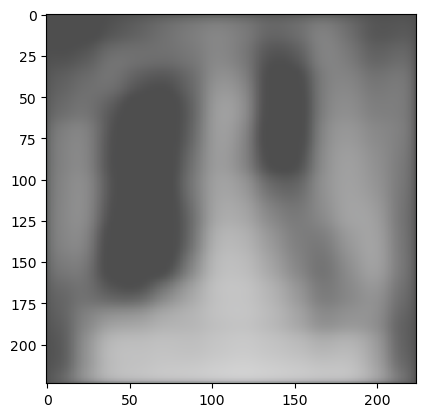

In [28]:
sample_image = train_data[7]
sample_image = np.expand_dims(sample_image,axis=0)
image_pred = model.predict(sample_image)
image_pred = np.expand_dims(image_pred[0],axis=0)
#plt.imshow(sample_image[0])
plt.imshow(image_pred[0])
plt.show()

1/1 [==============================] - 0s 137ms/step


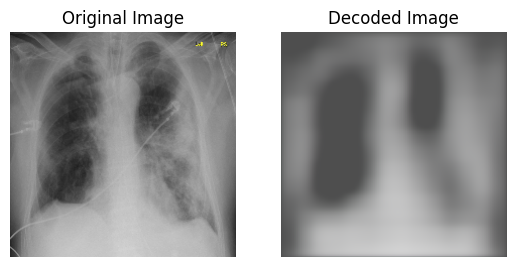

In [148]:
sample_image = train_data[7]
sample_image = np.expand_dims(sample_image,axis=0)
image_pred = model.predict(sample_image)
plot_(sample_image[0,:,:,:],'','',1,2,1,"Original Image","","","",True)
plot_(image_pred[0,:,:],'','',1,2,2,"Decoded Image","","","",True)
plt.show()

1/1 [==============================] - 0s 48ms/step


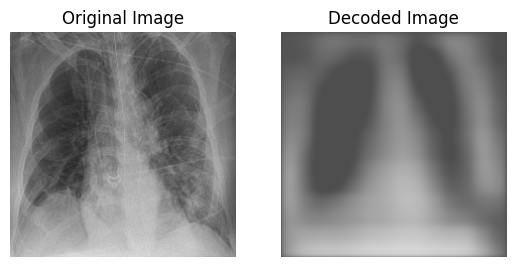

In [149]:
sample_image = train_data[500]
sample_image = np.expand_dims(sample_image,axis=0)
image_pred = model.predict(sample_image)
plot_(sample_image[0,:,:,:],'','',1,2,1,"Original Image","","","",True)
plot_(image_pred[0,:,:],'','',1,2,2,"Decoded Image","","","",True)
plt.show()

1/1 [==============================] - 0s 47ms/step


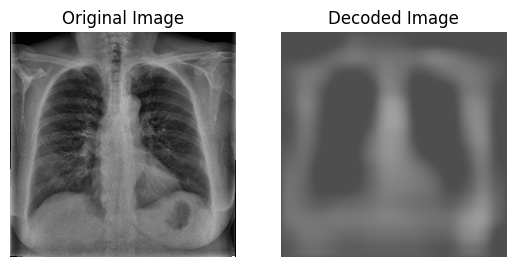

In [150]:
sample_image = train_data[40]
sample_image = np.expand_dims(sample_image,axis=0)
image_pred = model.predict(sample_image)
plot_(train_data[40],'','',1,2,1,"Original Image","","","",True)
plot_(image_pred[0,:,:],'','',1,2,2,"Decoded Image","","","",True)
plt.show()

# Feature Extraction

In [32]:
from keras import backend as K
def feature_extraction(model, data, layer = 4):

    """
    Creating a function to run the initial layers of the encoder model. (to get feature extraction from any layer of the model)
    Arguments:
    model - (Auto encoder model) - Trained model
    data - (np.ndarray) - list of images to get feature extraction from trained model
    layer - (int) - from which layer to take the features(by default = 4)
    Returns:
    pooled_array - (np.ndarray) - array of extracted features of given images
    """
    global encoded_function
    
    try:
        encoded_function = K.function([model.layers[0].input],[model.layers[layer].output])
    except:
        pass
    encoded_array = encoded_function([data])[0]
    pooled_array = encoded_array.max(axis=-1)
    return encoded_array

(10, 14, 14, 512)


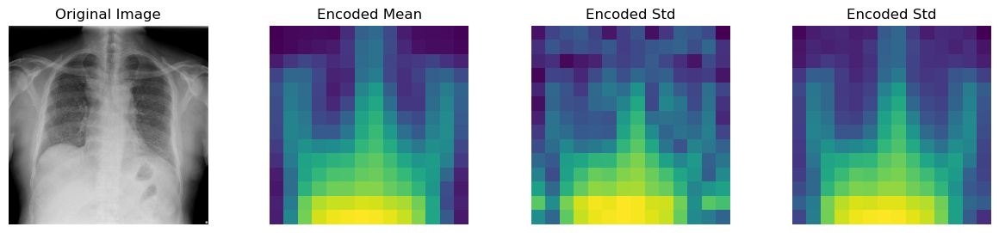

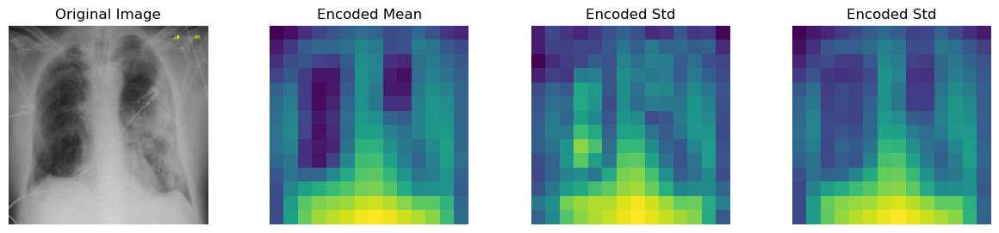

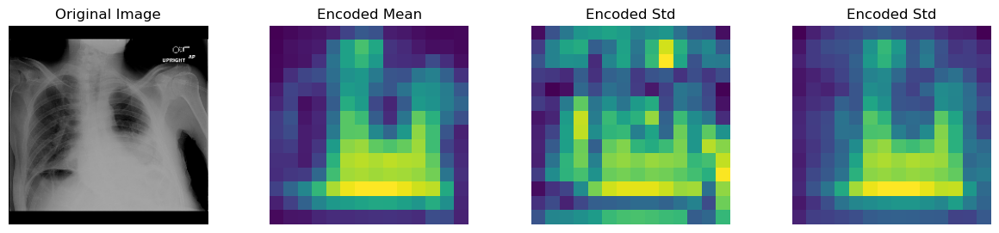

In [33]:
encoded = feature_extraction(model,train_data[:10],12)
print(encoded.shape)
for index in [2,7,9]:   # 3 random images
    plt.figure(figsize=(15,3))
    plot_(train_data[index],'','',1,4,1,"Original Image","","",'',True)
    plot_(encoded[index].mean(axis=-1),'','',1,4,2,"Encoded Mean","","",'',True)
    plot_(encoded[index].max(axis=-1),'','',1,4,3,"Encoded Std","","",'',True)
    plot_(encoded[index].std(axis=-1),'','',1,4,4,"Encoded Std","","",'',True)
    plt.show()

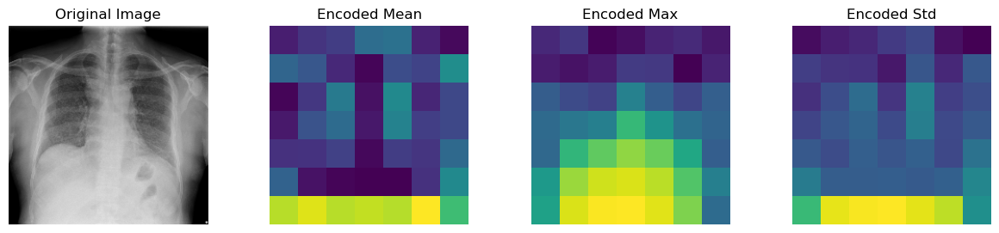

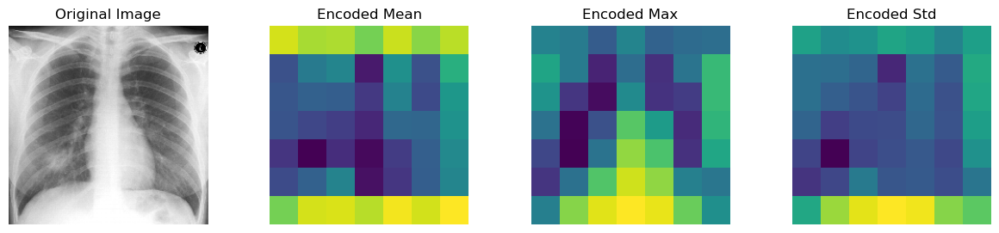

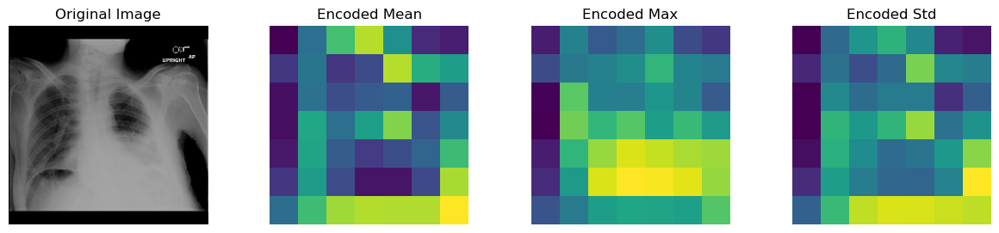

In [34]:
encoded_layer = feature_extraction(model,train_data[:10],9)
for index in [2,6,9]:   # 3 random images
    plt.figure(figsize=(15,3))
    plot_(train_data[index],'','',1,4,1,"Original Image","","",'',True)
    plot_(encoded_layer[index].mean(axis=-1),'','',1,4,2,"Encoded Mean","","",'',True)
    plot_(encoded_layer[index].max(axis=-1),'','',1,4,3,"Encoded Max","","",'',True)
    plot_(encoded_layer[index].std(axis=-1),'','',1,4,4,"Encoded Std","","",'',True)
    plt.show()

# Dimensionality Reduction

In [35]:
def get_batches(data, batch_size=1000):

    """
    Taking batch of images for extraction of images.
    Arguments:
    data - (np.ndarray or list) - list of image array to get extracted features.
    batch_size - (int) - Number of images per each batch
    Returns:
    list - extracted features of each images
    """

    if len(data) < batch_size:
        return [data]
    n_batches = len(data) // batch_size
    
    # If batches fit exactly into the size of df.
    if len(data) % batch_size == 0:
        return [data[i*batch_size:(i+1)*batch_size] for i in range(n_batches)]   

    # If there is a remainder.
    else:
        return [data[i*batch_size:min((i+1)*batch_size, len(data))] for i in range(n_batches+1)]

In [36]:
d = np.concatenate([train_data,test_data],axis=0)
d.shape

(930, 224, 224, 3)

In [37]:
X_encoded = []
i=0
# Iterate through the full training set.
for batch in get_batches(d, batch_size=300):
    i+=1
    # This line runs our pooling function on the model for each batch.
    X_encoded.append(feature_extraction(model, batch, 12))
    
X_encoded = np.concatenate(X_encoded)

In [38]:
X_encoded.shape 

(930, 14, 14, 512)

In [39]:
X_encoded_reshape = X_encoded.reshape(X_encoded.shape[0], X_encoded.shape[1]*X_encoded.shape[2]*X_encoded.shape[3])
print('Encoded shape:', X_encoded_reshape.shape)
np.save('X_encoded_compressed.npy',X_encoded_reshape)

Encoded shape: (930, 100352)


In [40]:
X_encoded_reshape = np.load('X_encoded_compressed.npy')
X_encoded_reshape.shape

(930, 100352)

In [41]:
lisp = pd.concat([train_files, test_files])
lisp = lisp.reset_index()
print(len(lisp))

930


In [42]:
X_encoded_reshape.shape

(930, 100352)

## TSNE

In [43]:
transform = TSNE 
trans = transform(n_components=2, random_state=1) 
values = trans.fit_transform(X_encoded_reshape) 

In [ ]:
values[:,0]

In [45]:
scaler = StandardScaler()
values_scaled = scaler.fit_transform(values)

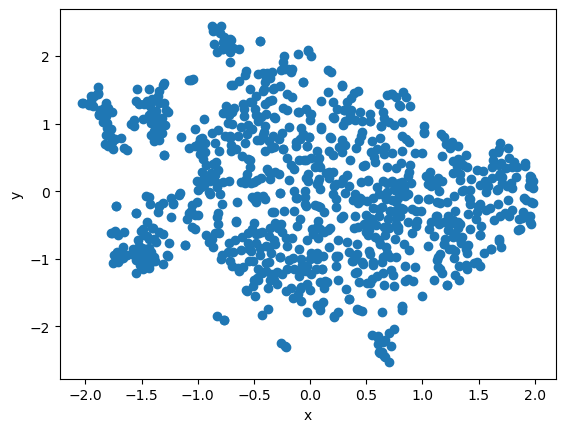

In [46]:
#scatterplot for values
plt.scatter(values_scaled[:,0], values_scaled[:,1])
plt.xlabel('x')
plt.ylabel('y')
plt.show()


## PCA

In [47]:
from sklearn.decomposition import PCA

In [48]:
pca = PCA(n_components=5)
pca_values = pca.fit_transform(X_encoded_reshape)

In [49]:
pca_values

array([[-4.132101  , -2.685837  , -5.0802493 , -2.7999752 , -0.8498088 ],
       [-8.147604  , -0.9379221 ,  3.0182185 ,  1.9194005 ,  0.3669919 ],
       [-1.7718012 , -1.0860409 , -4.1135454 , -1.5087681 ,  0.79239947],
       ...,
       [-0.3714962 , -0.29653412,  1.930073  ,  2.4206636 , -1.7580142 ],
       [ 1.0291499 ,  0.11447862, -2.1353018 , -0.7608192 ,  1.1281911 ],
       [ 1.1224331 , -3.486361  , -2.5036063 , -0.43196827, -3.735203  ]],
      dtype=float32)

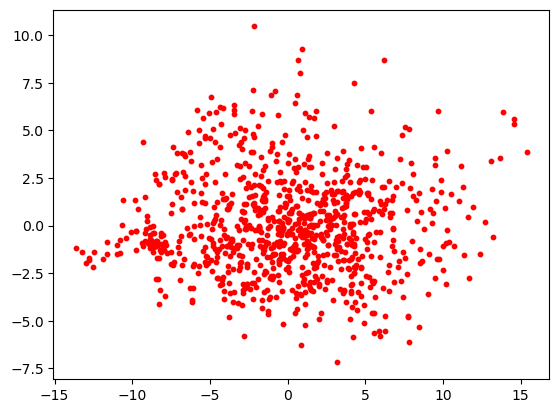

In [50]:
plt.scatter(pca_values[:,0], pca_values[:,1], c = 'red', s = 10);

## UMAP

!pip install umap-learn[plot]

In [51]:
import umap 
import umap.plot

In [52]:
umap_15 = umap.UMAP(n_neighbors=15, random_state=1, n_components=2).fit(X_encoded_reshape)

<Axes: >

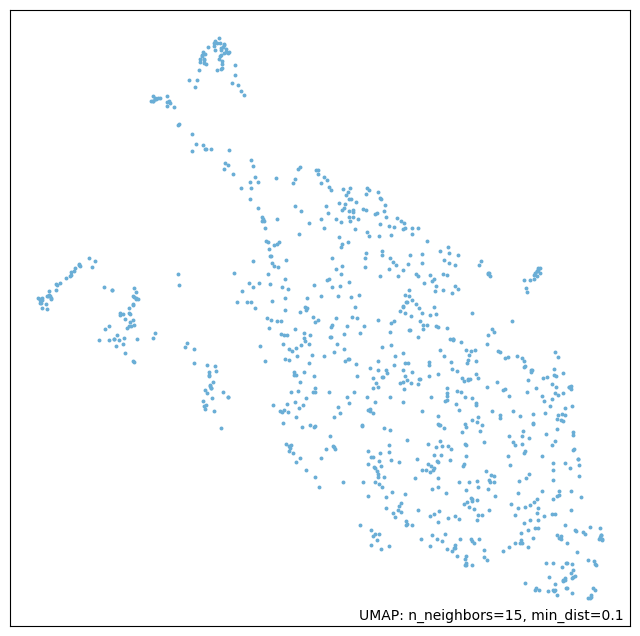

In [53]:
umap.plot.points(umap_15)

In [54]:
umap_15.embedding_

array([[ 7.400697 ,  7.548373 ],
       [ 6.1872697, 10.509294 ],
       [ 8.054148 ,  6.249493 ],
       ...,
       [10.627894 ,  6.655031 ],
       [ 8.990691 ,  5.759635 ],
       [11.355989 ,  7.872687 ]], dtype=float32)

In [55]:
umap_5 = umap.UMAP(n_neighbors=5, random_state=1, n_components=2).fit(X_encoded_reshape)

<Axes: >

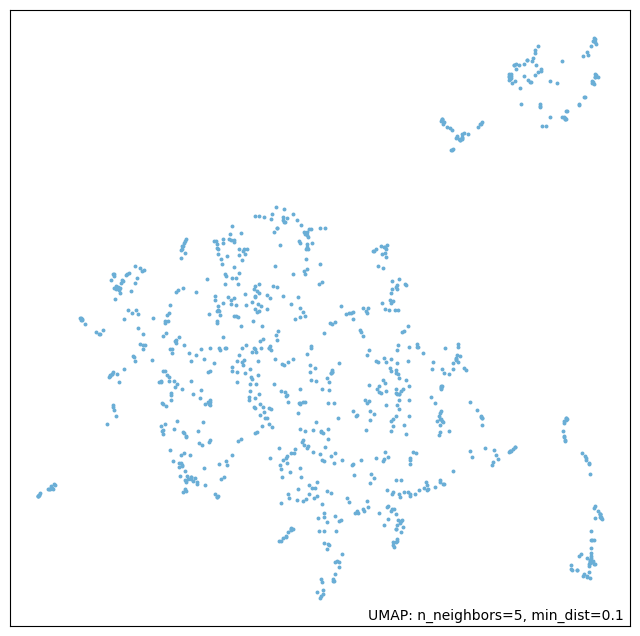

In [56]:
umap.plot.points(umap_5)

In [57]:
def plot_(x,y1,y2,row,col,ind,title,xlabel,ylabel,label,isimage=False,color='b'):

    """
    This function is used for plotting images and graphs (Visualization of end results of model training)
    Arguments:
    x - (np.ndarray or list) - an image array
    y1 - (list) - for plotting graph on left side.
    y2 - (list) - for plotting graph on right side.
    row - (int) - row number of subplot 
    col - (int) - column number of subplot
    ind - (int) - index number of subplot
    title - (string) - title of the plot 
    xlabel - (list) - labels of x axis
    ylabel - (list) - labels of y axis
    label - (string) - for adding legend in the plot
    isimage - (boolean) - True in case of image else False
    color - (char) - color of the plot (prefered green for training and red for testing).
    """
    
    plt.subplot(row,col,ind)
    if isimage:
        plt.imshow(x)
        plt.title(title)
        plt.axis('off')
    else:
        plt.plot(y1,label=label,color='g'); plt.scatter(x,y1,color='g')
        if y2!='': plt.plot(y2,color=color,label='validation'); plt.scatter(x,y2,color=color)
        plt.grid()
        plt.legend()
        plt.title(title); plt.xlabel(xlabel); plt.ylabel(ylabel)

## T-SNE

In [ ]:
K = range(1,10)

distortions = []

for k in K:
    print("Number of clusters: "+str(k))
    kmeans = KMeans(n_clusters = k, random_state=0).fit(values_scaled)
    labels=kmeans.labels_
    centroids = kmeans.cluster_centers_
    
    distortions.append(kmeans.inertia_)

plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [ ]:
from sklearn.metrics import silhouette_score

sil = []
kmax = 10

# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
for k in range(2, kmax+1):
    kmeans = KMeans(n_clusters = k, random_state=0).fit(values_scaled)
    labels = kmeans.labels_
    sil.append(silhouette_score(values_scaled, labels, metric = 'euclidean'))

plt.figure(figsize=(16,8))
plt.plot(range(2,11), sil, 'bx-') #kmax range
plt.xlabel('k')
plt.ylabel('Silhouette Score')
plt.title('The Silhouette Method showing the optimal k')
plt.show()

K = range(1,10)
distortions = []

for k in K:
    print("if Number of clusters: "+str(k))
    kmeans = KMeans(n_clusters = k, random_state=0).fit(values_scaled)
    labels=kmeans.labels_
    centroids = kmeans.cluster_centers_
    
    distortions.append(kmeans.inertia_)
    
    plt.figure(figsize=(10,5)) 
    plt.subplot(1,1,1)
    plt.scatter(values[:,0], values[:,1], c= kmeans.labels_.astype(float), s=50, alpha=0.5)
    plt.scatter(centroids[:, 0], centroids[:, 1], c=None, s=50)
    plt.show()
    
    for row in range(k): 
        iter=0
        plt.figure(figsize=(13,3))
        for i,iterator in enumerate(labels):
            if iterator == row:
                img = cv2.imread(IMAGE_DIRECTORY+'\'+lisp['filepath'][i])
                img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
                plot_(img,"","",1,6,iter+1,"cluster="+str(row),"","","",True)
                iter+=1
            if iter>=5: break
        plt.show()
    print() 

## UMAP - KMeans Clusters

Number of clusters: 1
Number of clusters: 2
Number of clusters: 3
Number of clusters: 4
Number of clusters: 5
Number of clusters: 6
Number of clusters: 7
Number of clusters: 8
Number of clusters: 9


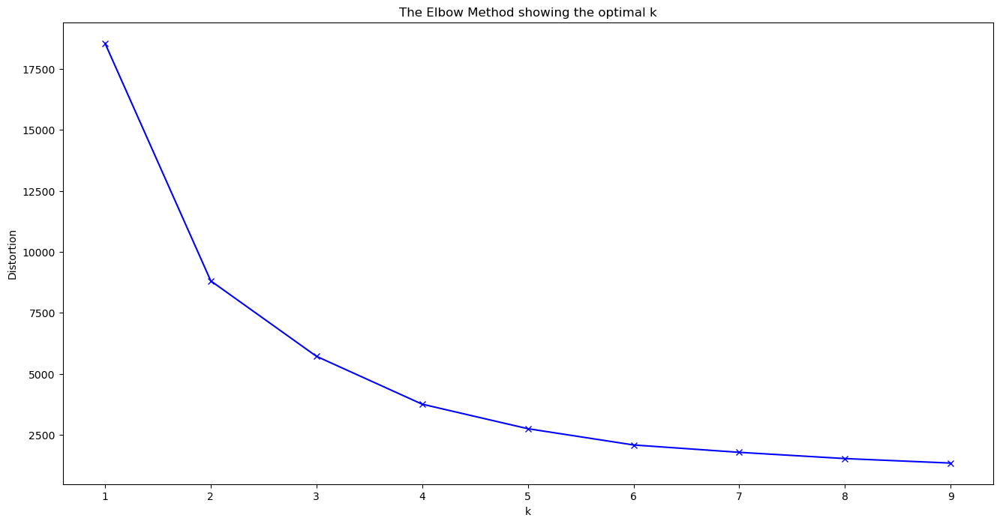

In [60]:
K = range(1,10)

distortions = []

for k in K:
    print("Number of clusters: "+str(k))
    kmeans = KMeans(n_clusters = k, random_state=0).fit(umap_5.embedding_)
    labels=kmeans.labels_
    centroids = kmeans.cluster_centers_
    
    distortions.append(kmeans.inertia_)

plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

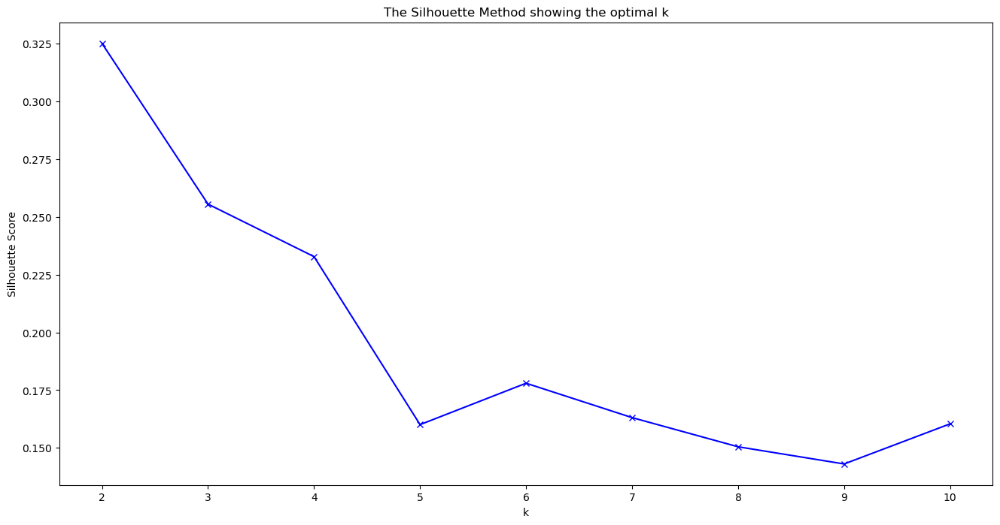

In [149]:
from sklearn.metrics import silhouette_score

sil = []
kmax = 10

# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
for k in range(2, kmax+1):
    kmeans = KMeans(n_clusters = k, random_state=0).fit(umap_5.embedding_)
    labels = kmeans.labels_
    sil.append(silhouette_score(values_scaled, labels, metric = 'euclidean'))

plt.figure(figsize=(16,8))
plt.plot(range(2,11), sil, 'bx-') #kmax range
plt.xlabel('k')
plt.ylabel('Silhouette Score')
plt.title('The Silhouette Method showing the optimal k')
plt.show()

if Number of clusters: 1


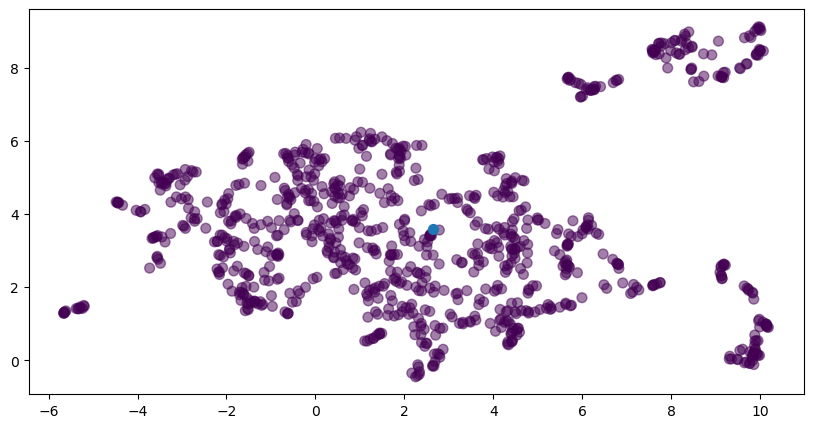

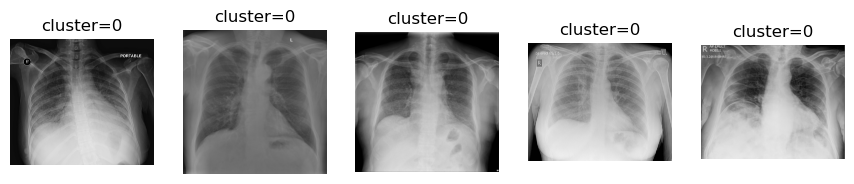


if Number of clusters: 2


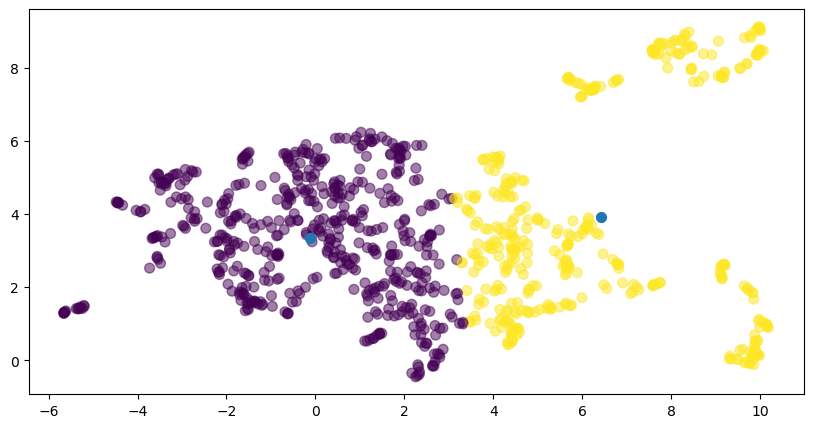

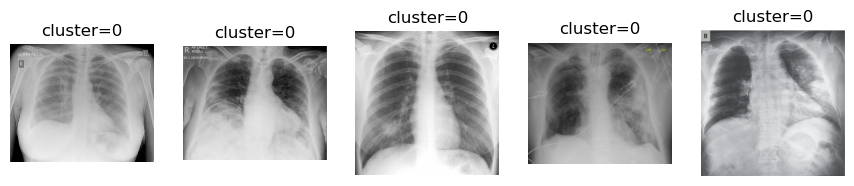

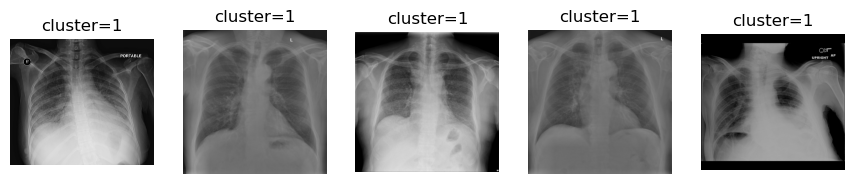


if Number of clusters: 3


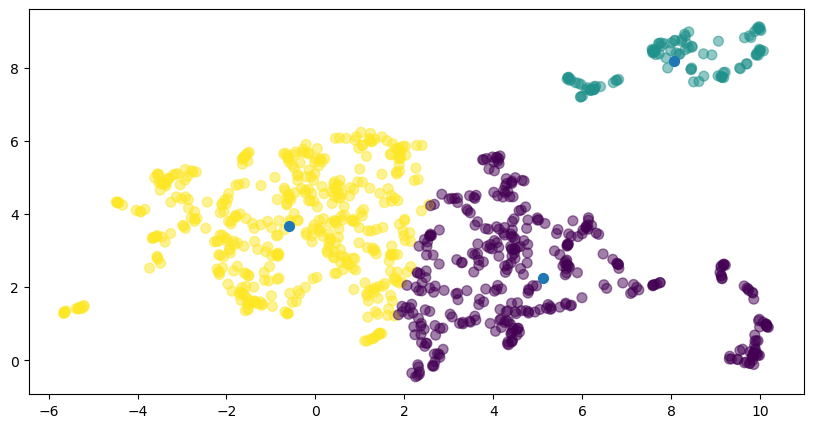

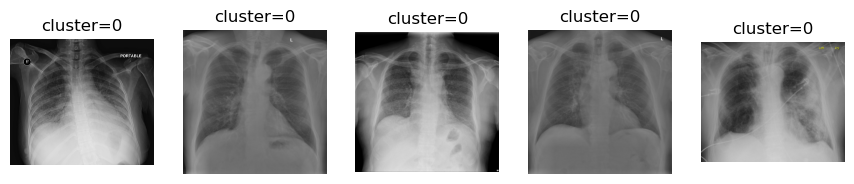

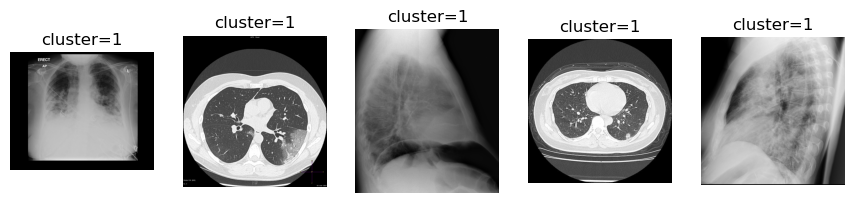

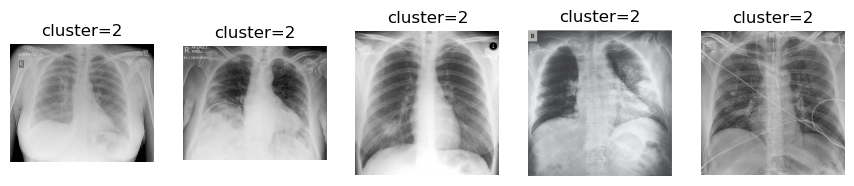


if Number of clusters: 4


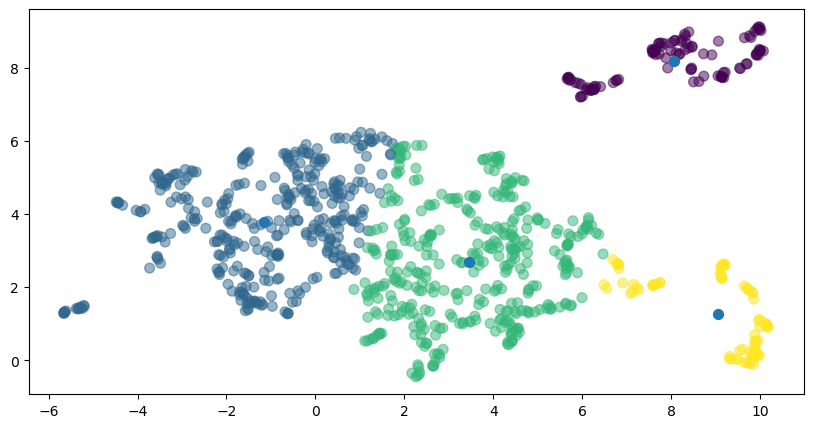

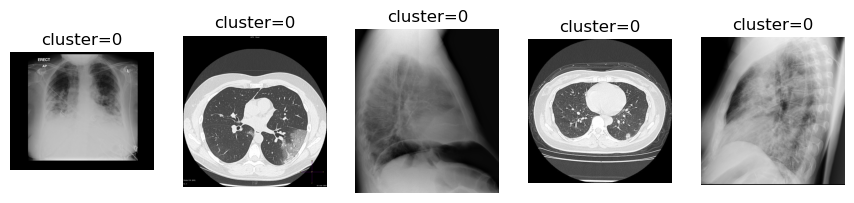

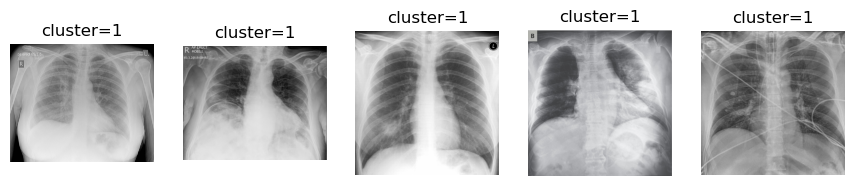

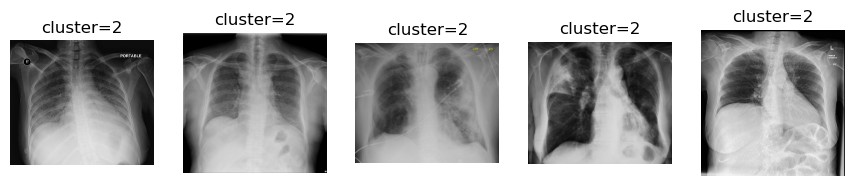

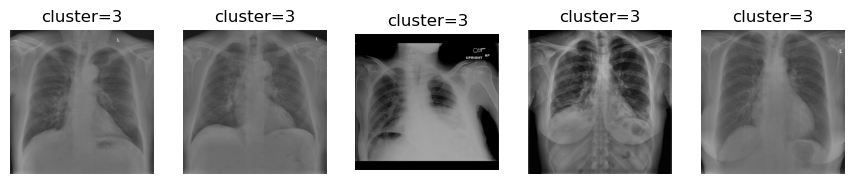


if Number of clusters: 5


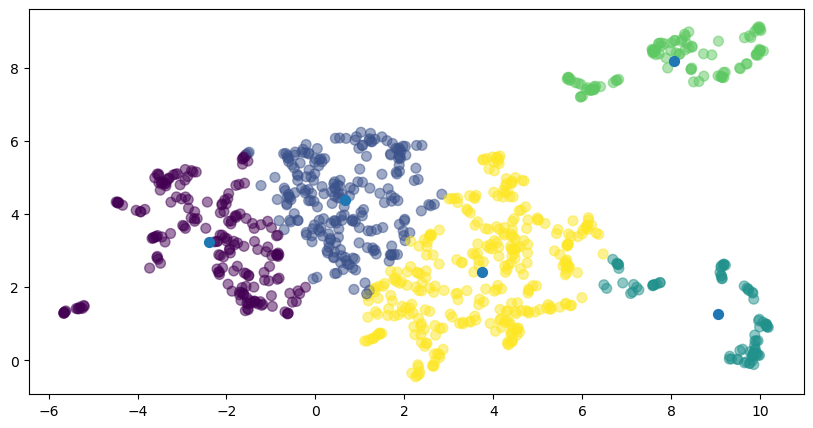

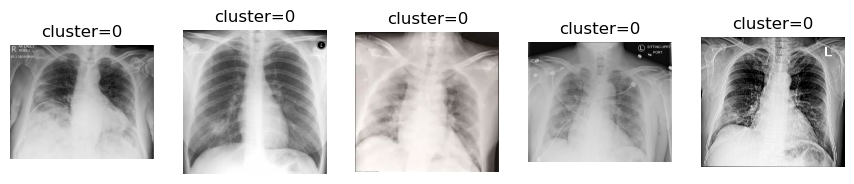

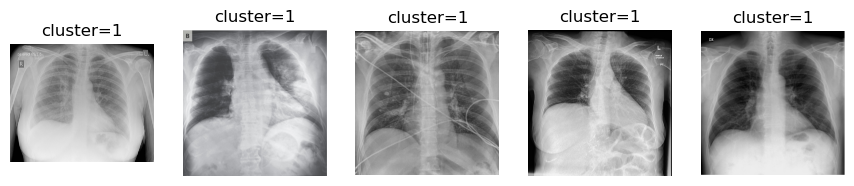

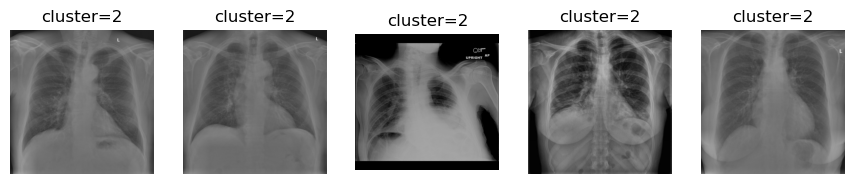

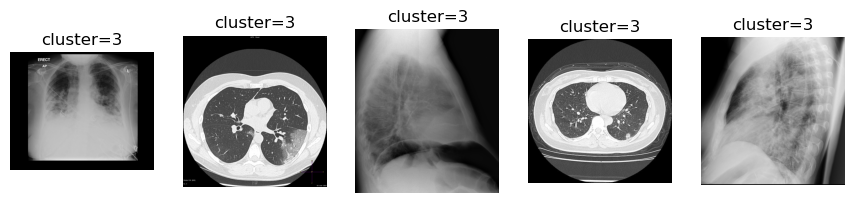

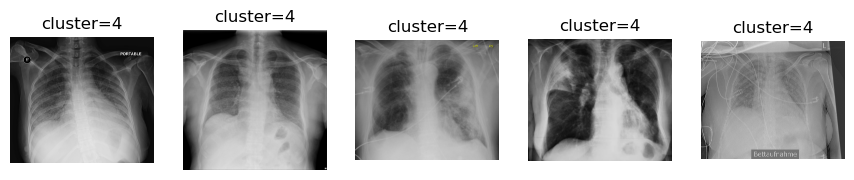


if Number of clusters: 6


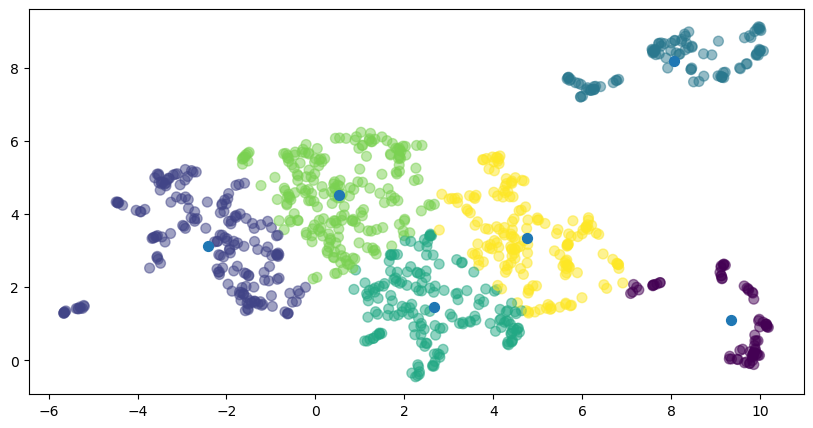

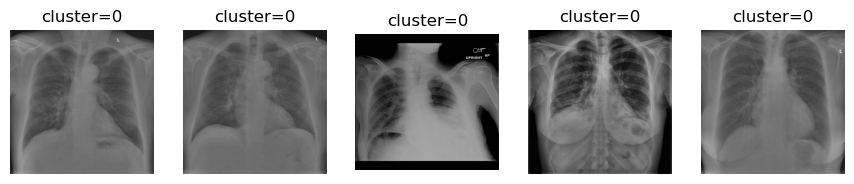

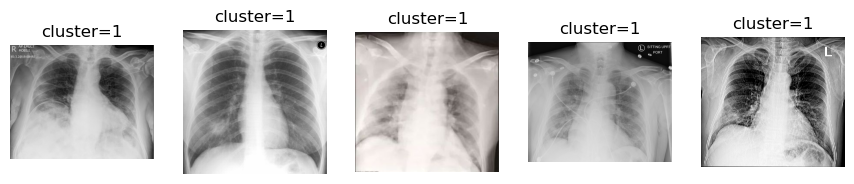

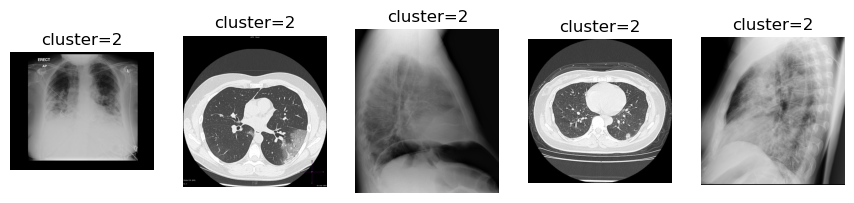

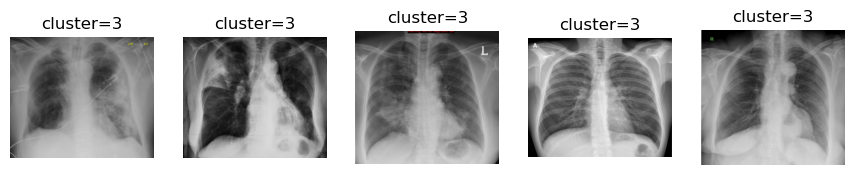

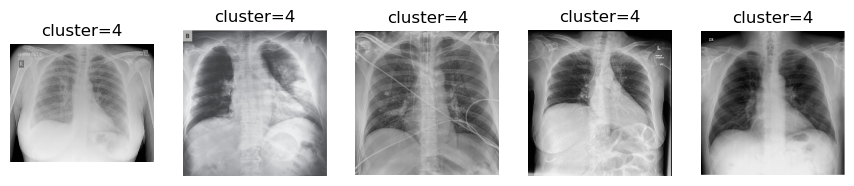

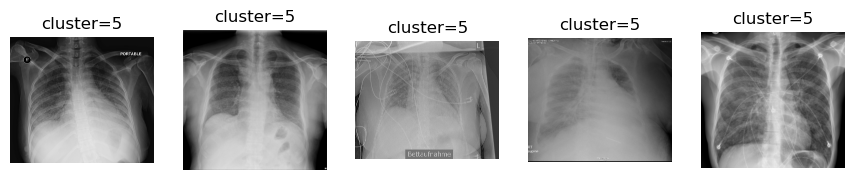


if Number of clusters: 7


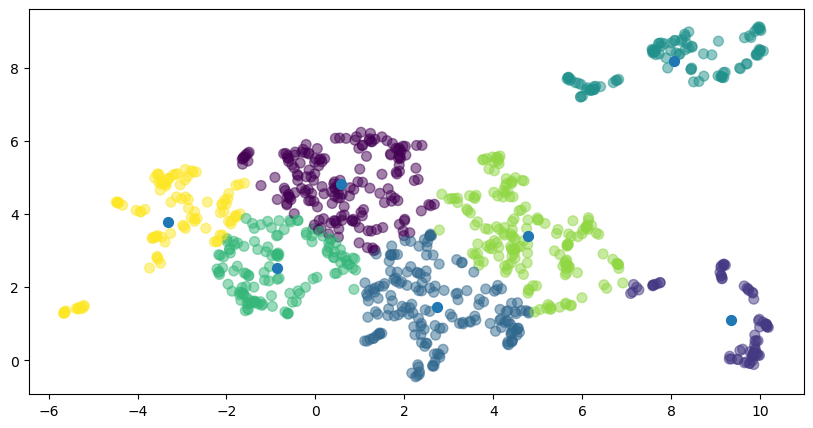

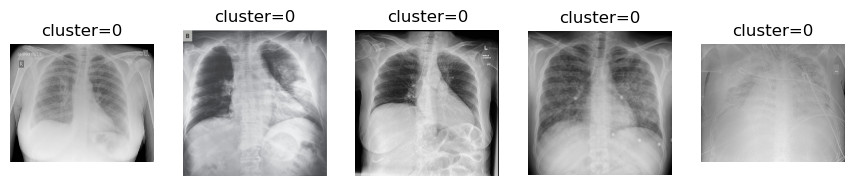

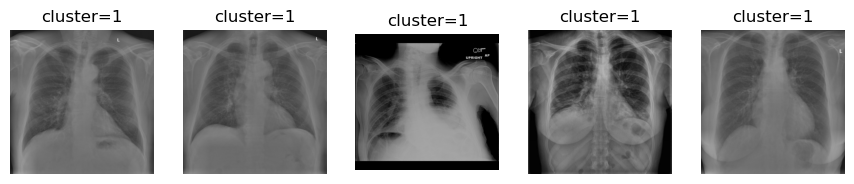

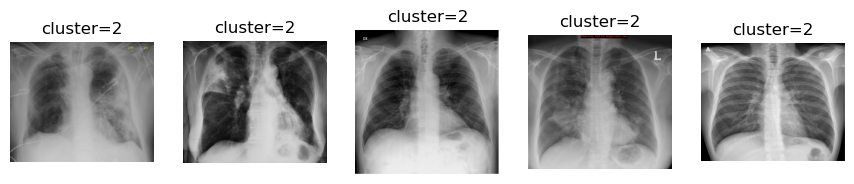

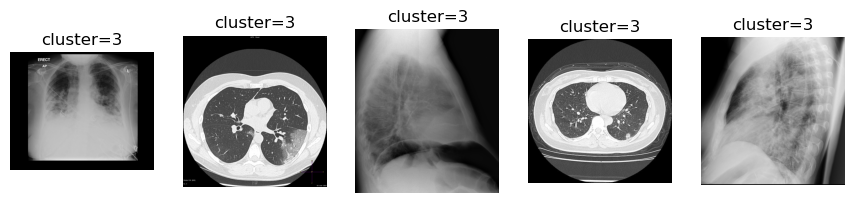

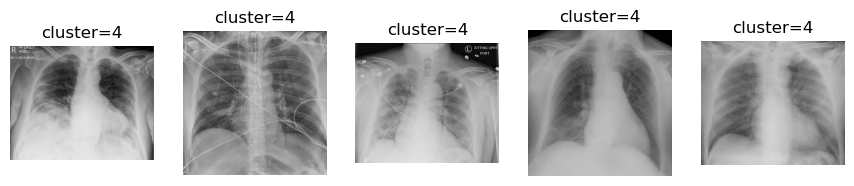

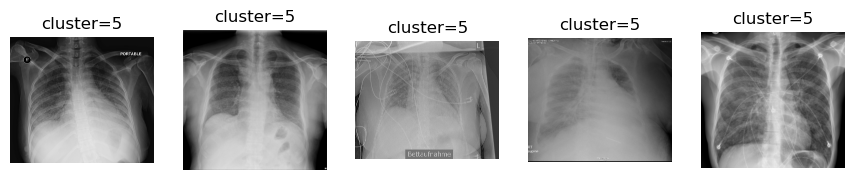

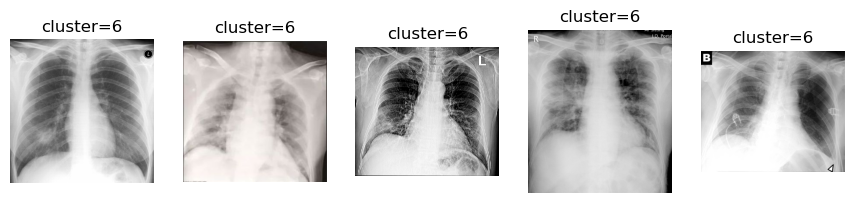


if Number of clusters: 8


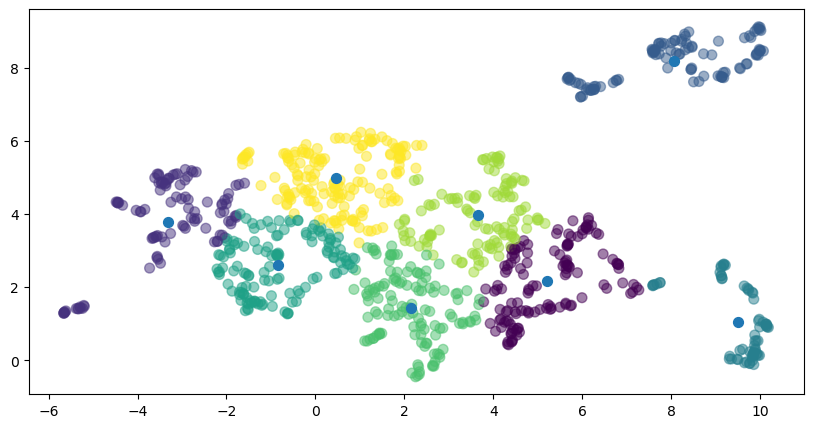

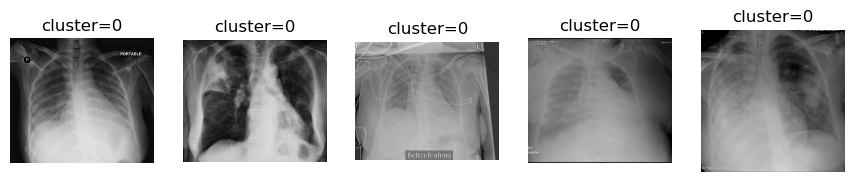

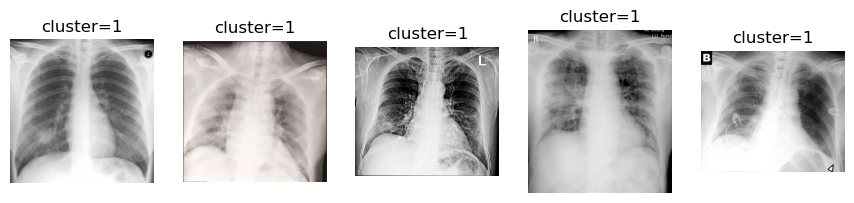

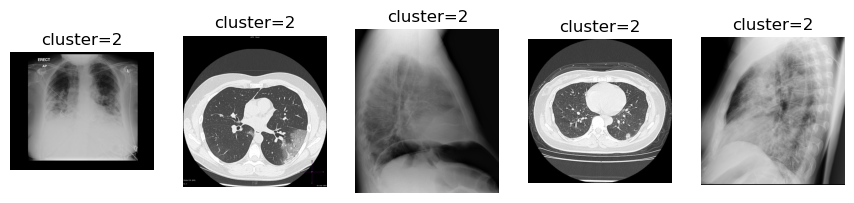

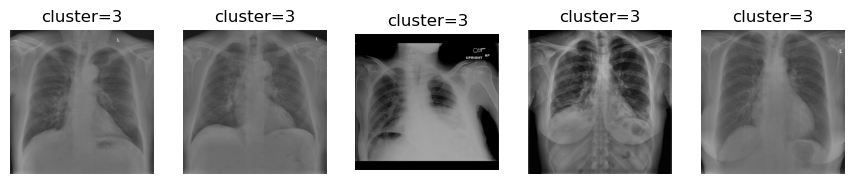

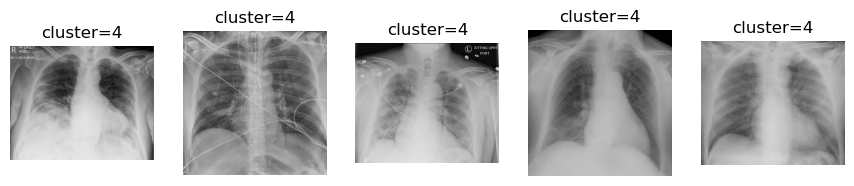

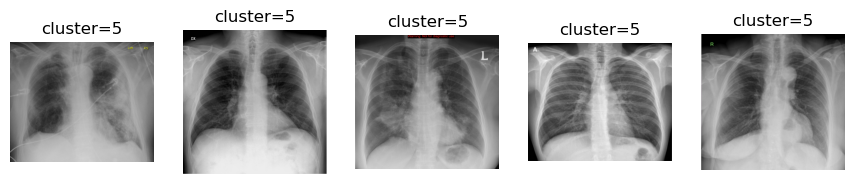

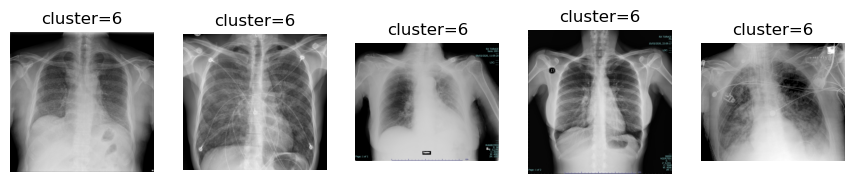

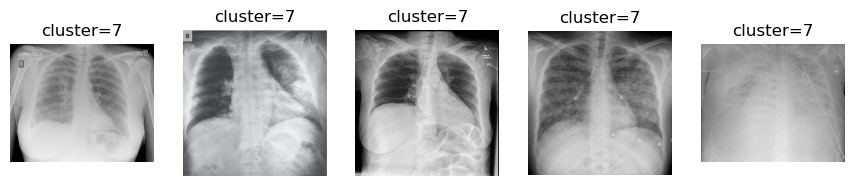


if Number of clusters: 9


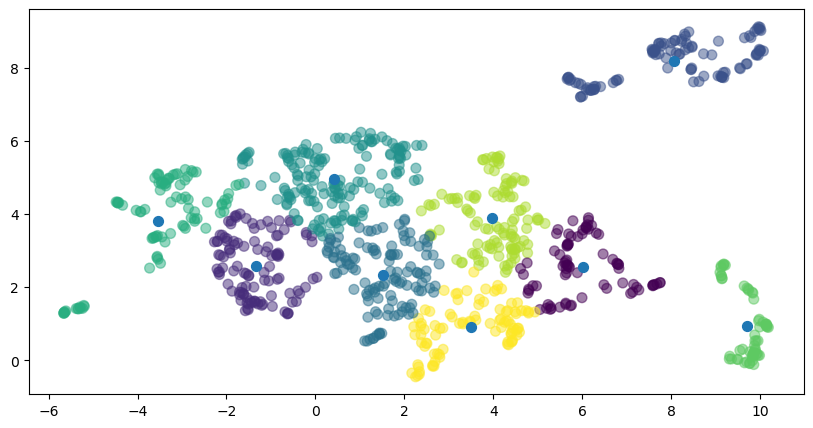

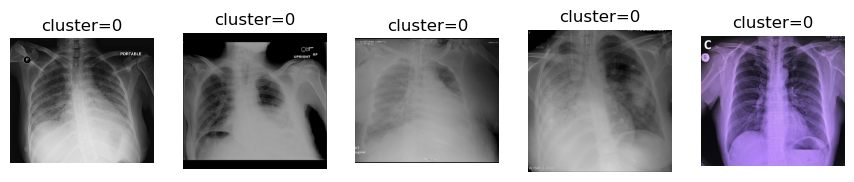

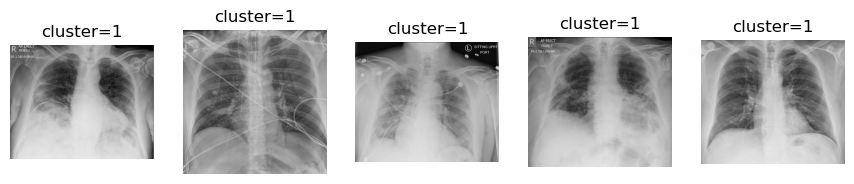

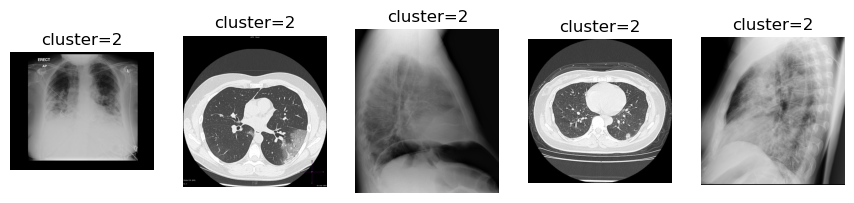

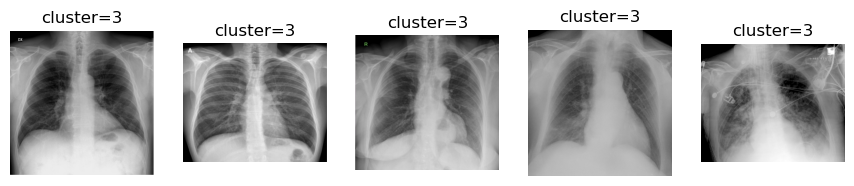

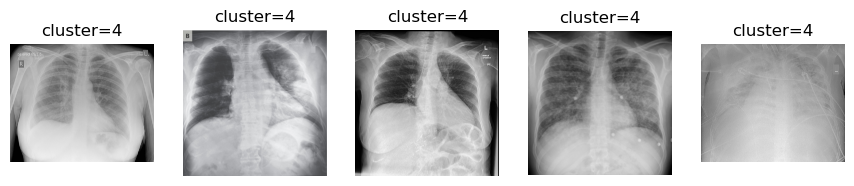

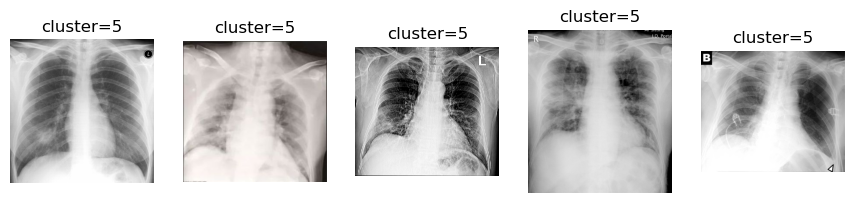

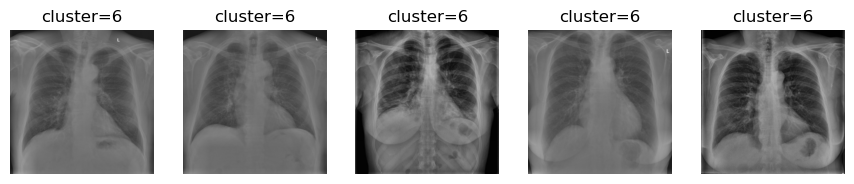

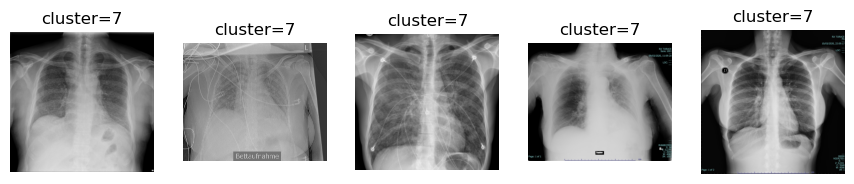

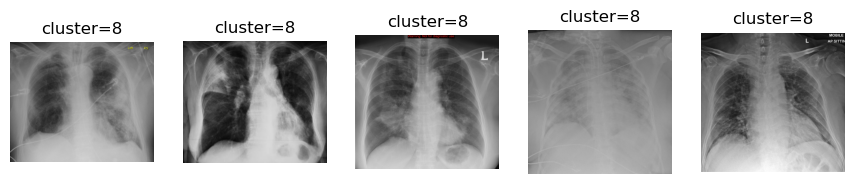

In [62]:
K = range(1,10)
distortions = []

for k in K:
    print("if Number of clusters: "+str(k))
    kmeans = KMeans(n_clusters = k, random_state=0).fit(umap_5.embedding_)
    labels=kmeans.labels_
    centroids = kmeans.cluster_centers_
    
    distortions.append(kmeans.inertia_)
    
    plt.figure(figsize=(10,5)) 
    plt.subplot(1,1,1)
    plt.scatter(umap_5.embedding_[:,0], umap_5.embedding_[:,1], c= kmeans.labels_.astype(float), s=50, alpha=0.5)
    plt.scatter(centroids[:, 0], centroids[:, 1], c=None, s=50)
    plt.show()
    
    for row in range(k): 
        iter=0
        plt.figure(figsize=(13,3))
        for i,iterator in enumerate(labels):
            if iterator == row:
                img = cv2.imread(IMAGE_DIRECTORY+'/'+lisp['filepath'][i])
                img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
                plot_(img,"","",1,6,iter+1,"cluster="+str(row),"","","",True)
                iter+=1
            if iter>=5: break
        plt.show()
    print() 

In [63]:
#Training the model with optimial K value
kmeans = KMeans(n_clusters=5, random_state=0).fit(umap_5.embedding_)
labels=kmeans.labels_
centroids = kmeans.cluster_centers_

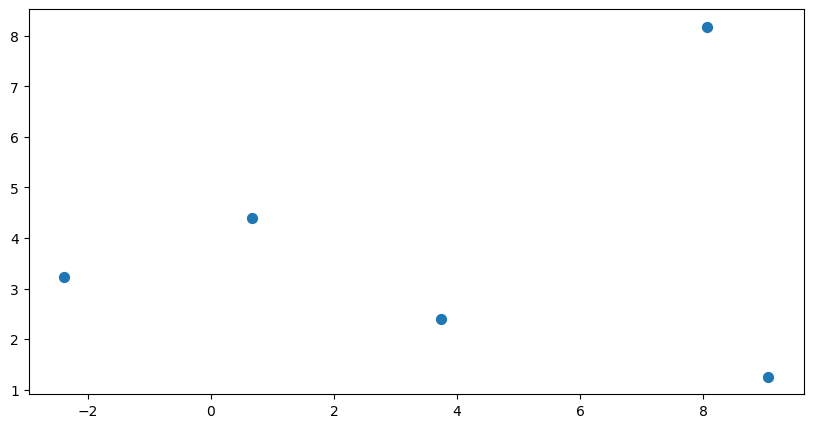

In [64]:
plt.figure(figsize=(10,5)) 
plt.subplot(1,1,1)
#plt.scatter(values[:,0], values[:,1], c= kmeans.labels_.astype(float), s=50, alpha=0.5)
plt.scatter(centroids[:, 0], centroids[:, 1], c=None, s=50)
plt.show()

In [65]:
kmeans_file = 'kmeans_model.pkl'
joblib.dump(kmeans,kmeans_file)

['kmeans_model.pkl']

### KNN

In [66]:
clusters_features = []
cluster_files=[]
for i in range(0,9):
    i_cluster = []
    i_labels=[]
    for iter,j in enumerate(kmeans.labels_):
        if j==i:
            i_cluster.append(umap_5.embedding_[iter])
            i_labels.append(lisp['filepath'][iter])
    i_cluster = np.array(i_cluster)
    clusters_features.append(i_cluster)
    cluster_files.append(i_labels)

In [67]:
labels=[]
data=[]
files=[]
for iter,i in enumerate(clusters_features):
    data.extend(i)
    labels.extend([iter for i in range(i.shape[0])])
    files.extend(cluster_files[iter])
print(np.array(labels).shape)
print(np.array(data).shape)
print(np.array(files).shape)

(930,)
(930, 2)
(930,)


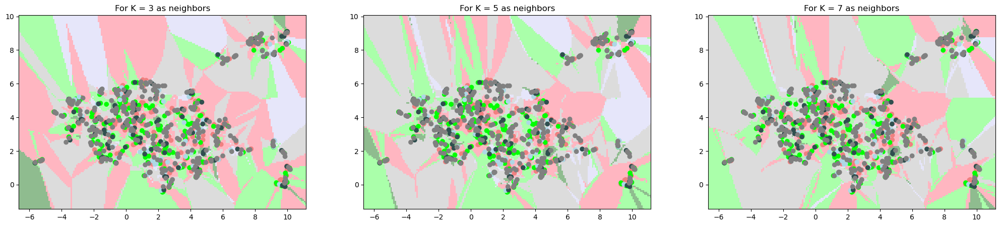

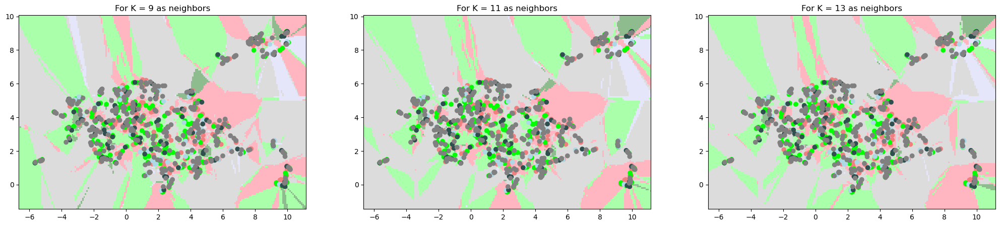

In [68]:
for i in [[3,5,7],[9,11,13]]:
    plt.figure(figsize=(25,5))
    for iter,j in enumerate(i):
        n_neighbors = j
        X = umap_5.embedding_  
        y = labels
        h = .09  # step size in the mesh
        cmap_light = ListedColormap(['#FFB6C1', '#AAFFAA', '#AAAAFF','#E6E6FA','#8FBC8F','#DCDCDC'])
        cmap_bold = ListedColormap(['#F08080', '#00FF00', '#0000FF','#ADD8E6','#2F4F4F','#808080'])
        clf = KNeighborsClassifier(n_neighbors)
        clf.fit(X, y)

        x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1 
        y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1 
        xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
        Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])

        plt.subplot(1,3,iter+1)
        Z = Z.reshape(xx.shape)
        plt.pcolormesh(xx, yy, Z, cmap=cmap_light)

        # Plot also the training points 
        plt.scatter(X[:, 0], X[:, 1], c=y, cmap=cmap_bold)
        plt.xlim(xx.min(), xx.max())
        plt.ylim(yy.min(), yy.max())
        plt.title("For K = {} as neighbors".format(j))
    plt.show()    

In [69]:
knn = KNeighborsClassifier(n_neighbors=5,algorithm='auto',n_jobs=-1)
knn.fit(np.array(data),np.array(labels))

KNeighborsClassifier(n_jobs=-1)

In [70]:
labels_set = set(labels)
labels_set

{0, 1, 2, 3, 4}

In [71]:
knn_file = 'knn_model.pkl'
joblib.dump(knn,knn_file)

['knn_model.pkl']

In [72]:
from sklearn.metrics.pairwise import cosine_similarity

### Results

In [73]:
def results_(query,result):
    
    """
    Plotting the N similar images from the dataset with query image.
    Arguments:
    query - (string) - filename of the query image
    result - (list) - filenames of similar images
    """

    def read(img):
        image_read = cv2.imread(IMAGE_DIRECTORY+'/'+img)
        image_read = cv2.cvtColor(image_read,cv2.COLOR_BGR2RGB)
        return image_read
    
    def image_in_dataframe(img_array):
        img_array = Image2.fromarray(img_array)
        return img_array
    
    def get_thumbnail(path):
        image_load = Image2.open(path)
        image_load.thumbnail((150, 150), Image2.LANCZOS)
        return image_load
    
    def image_base64(im):
        if isinstance(im, str):
            im =get_thumbnail(im)
        with BytesIO() as buffer:
            im.save(buffer, 'jpeg')
            return base64.b64encode(buffer.getvalue()).decode()
    
    def image_formatter(im):
        return f'<img src="data:image/jpeg;base64,{image_base64(im)}">'
   
    def path_to_image_html(path):
        return '<img src="'+ path + '"/>'

    plt.figure(figsize=(10,5))
    
    if type(query)!=type(30):
        plot_(query,"","",1,1,1,"Query Image","","","",True)
    else:
        plot_(read(files[query]),"","",1,1,1,"Query Image "+files[query],"","","",True)
    plt.show()
    plt.figure(figsize=(40,30))
    
    try:
        img_path = IMAGE_DIRECTORY+f'/{files[query]}'
        img = image.load_img(img_path, target_size=(224,224))
        img_data = image.img_to_array(img)
        base_img_path = IMAGE_DIRECTORY+f'/{files[query]}'
        base_img = image.load_img(base_img_path, target_size=(224,224))
        base_img_data = image.img_to_array(base_img)
    except:
        img_data = image.img_to_array(query)
        base_img_data = image.img_to_array(query)
    
    img_data = np.expand_dims(img_data,axis=0)
    img_data = preprocess_input(img_data)
    feature = model.predict(img_data)

    X_encoded_query = []
    X_encoded_query.append(feature_extraction(model, feature, 12))
    X_encoded_query = np.concatenate(X_encoded_query)
    X_encoded_query_reshape = X_encoded_query.reshape(X_encoded_query.shape[0], X_encoded_query.shape[1]*X_encoded_query.shape[2]*X_encoded_query.shape[3])
    
    #values_query = trans.fit_transform(X_encoded_query_reshape) 
    #values_query_scaled = scaler.transform(values_query)
    umap_query = umap_5.transform(X_encoded_query_reshape)
        
    #base_image = cv2.imread(f'images/{files[query]}')
    distance_dict = []
    result_files = []
    percentage_list = []
    distance_dict_raw = []
    cosine_list = []
    cosine_list_encoded = []
   
    for iter,i in enumerate(result):
        
        '''img_path = IMAGE_DIRECTORY+f'/{files[i]}'
        img = image.load_img(img_path, target_size=(224,224))
        img_data = image.img_to_array(img)
        img_data = np.expand_dims(img_data,axis=0)
        img_data = preprocess_input(img_data)
        feature = model.predict(img_data)'''

        image_array_list = []
        img = cv2.imread(IMAGE_DIRECTORY+f'/{files[i]}')
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (224,224))
        image_array_list.append(np.array(img))
        
        image_array = np.array(image_array_list)
        image_array = image_array.reshape(image_array.shape[0], 224, 224, 3) 
        image_array = image_array.astype('float32')
        image_array /= 255 
        
        feature = model.predict(image_array)
        
        
        '''
        X_encoded_query_res = []
        X_encoded_query_res.append(feature_extraction(model, feature, 12))
        X_encoded_query_res = np.concatenate(X_encoded_query_res)
        X_encoded_query_reshape_res = X_encoded_query_res.reshape(X_encoded_query_res.shape[0], X_encoded_query_res.shape[1]*X_encoded_query_res.shape[2]*X_encoded_query_res.shape[3])
        '''
        
        result_feature_extract = feature_extraction(model, feature, 12)
        encoded_reshape_result = result_feature_extract.reshape(result_feature_extract.shape[0], result_feature_extract.shape[1]*result_feature_extract.shape[2]*result_feature_extract.shape[3])
        umap_result = umap_5.transform(encoded_reshape_result)

        #values_query_result = trans.fit_transform(X_encoded_query_reshape_res) 
        #values_query_scaled_result = scaler.transform(values_query_result)
        


        '''
        Calculations for the similarity metrics

        Resulting image data
        Euclidean Distance using the UMAP coordinates
        Euclidean Distance using the raw pixel values
        Resulting image file
        Absolute difference of the images
        Percentage difference based on pixel count not zero
        '''
        
        #result image data
        result_img_path = IMAGE_DIRECTORY+f'/{files[i]}'
        result_img = image.load_img(result_img_path, target_size=(224,224))
        result_img_data = image.img_to_array(result_img)

        #euclidean distance using the umap coordinates
        distance_var = euclidean_distances(umap_query, umap_result)
        distance_dict.append('{:.4f}'.format(float(distance_var)))

        #euclidean distance using the raw pixel values
        distance_x_y = np.asarray([base_img_data - result_img_data])
        distance_var_raw = np.sqrt(np.sum(np.square(distance_x_y)))
        distance_dict_raw.append('{:.4f}'.format(float(distance_var_raw)))

        #resulting image file
        result_files.append(files[i])

        #absolute difference of the images
        res = cv2.absdiff(base_img_data, result_img_data)
        res = res.astype(np.uint8)
        percentage = (np.count_nonzero(res) * 100)/ res.size
        percentage_list.append(percentage)

        #cosine similarity
        cosine_similarity_score = cosine_similarity(umap_query, umap_result)
        cosine_list.append(cosine_similarity_score)
        cosine_similarity_score_encoded = cosine_similarity(X_encoded_query_reshape, encoded_reshape_result)
        cosine_list_encoded.append(cosine_similarity_score_encoded)
    
    
    result_df = pd.DataFrame()
    result_df['filename'] = result_files
    result_df['image'] = (result_df['filename'].apply(read)).apply(image_in_dataframe)
    result_df['euclidean_distance_umap'] = distance_dict
    result_df['euclidean_distance_raw'] = distance_dict_raw
    result_df['percentage'] = percentage_list
    result_df['cosine_similarity_umap'] = ['%.4f' % elem for elem in cosine_list]
    result_df['cosine_similarity_encoder'] = ['%.4f' % elem for elem in cosine_list_encoded]
    global saved_html
    saved_html = HTML((result_df.sort_values('euclidean_distance_raw', ascending=False).to_html(formatters={'image': image_formatter}, escape=False)))
   
    return saved_html

In [74]:
num = 100 #datapoint

In [75]:
%%time
res = knn.kneighbors(data[num].reshape(1,-1),return_distance=True,n_neighbors=8)

CPU times: total: 0 ns
Wall time: 20.3 ms


In [ ]:
results_(num,list(res[1][0])[1:])

In [77]:
def predictions(label,N=8,isurl=False):

    """
    Making predictions for the query images and returns N similar images from the dataset.
    We can either pass filename or the url for the image.
    Arguments:
    label - (string) - file name of the query image.
    N - (int) - Number of images to be returned
    isurl - (string) - if query image is from google is set to True else False(By default = False)
    """

    if isurl:
        img = io.imread(label)
        img = cv2.resize(img,(224,224))
    else:
        img_path = 'images/'+label
        img = image.load_img(img_path, target_size=(224,224))
   
    img_data = image.img_to_array(img)
    img_data = np.expand_dims(img_data,axis=0)
    img_data = preprocess_input(img_data)
    feature = model.predict(img_data)
    
    X_encoded_query = [] 
    X_encoded_query.append(feature_extraction(model, feature,12))
    X_encoded_query = np.concatenate(X_encoded_query) 
    X_encoded_query_reshape = X_encoded_query.reshape(X_encoded_query.shape[0], X_encoded_query.shape[1]*X_encoded_query.shape[2]*X_encoded_query.shape[3])
    
    umap_query = umap_trans.transform(X_encoded_query_reshape) 
    
    #feature = np.array(feature).flatten().reshape(1,-1)
    res = knn.kneighbors(umap_query,return_distance=True,n_neighbors=N)
    
    results_(img,list(res[1][0])[1:])
    return saved_html

query_path = '1-s2.0-S0929664620300449-gr3_lrg-a.jpg'
predictions(query_path)

# Optimization

## PyTorch Model

In [ ]:
%pip install torch torchvision

In [82]:
import os
import torch
from PIL import Image
from tqdm import tqdm
from torch.utils.data import Dataset
import torch.nn as nn
import torchvision.transforms as T
import numpy as np
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt

In [83]:
torch.cuda.is_available()

False

In [85]:
class FolderDataset(Dataset):

    def __init__(self, main_dir, transform=None):
        self.main_dir = main_dir
        self.transform = transform
        self.all_imgs = os.listdir(main_dir)

    def __len__(self):
        return len(self.all_imgs)
    
    def __getitem__(self, idx):
        img_loc = os.path.join(self.main_dir, self.all_imgs[idx])
        image = Image.open(img_loc).convert("RGB")

        if self.transform is not None:
            tensor_image = self.transform(image)

        return tensor_image, tensor_image

In [86]:
class ConvEncoder(nn.Module):

    def __init__(self):
        super().__init__()

        self.conv1 = nn.Conv2d(3, 16, (3, 3), padding=(1, 1))
        self.relu1 = nn.ReLU(inplace=True)
        self.maxpool1 = nn.MaxPool2d(2, 2)

        self.conv2 = nn.Conv2d(16, 32, (3, 3), padding=(1, 1))
        self.relu2 = nn.ReLU(inplace=True)
        self.maxpool2 = nn.MaxPool2d((2, 2))

        self.conv3 = nn.Conv2d(32, 64, (3, 3), padding=(1, 1))
        self.relu3 = nn.ReLU(inplace=True)
        self.maxpool3 = nn.MaxPool2d((2, 2))

        self.conv4 = nn.Conv2d(64, 128, (3, 3), padding=(1, 1))
        self.relu4 = nn.ReLU(inplace=True)
        self.maxpool4 = nn.MaxPool2d((2, 2))

        self.conv5 = nn.Conv2d(128, 256, (3, 3), padding=(1, 1))
        self.relu5 = nn.ReLU(inplace=True)
        self.maxpool5 = nn.MaxPool2d((2, 2))

    def forward(self, x):
        x = self.conv1(x)
        x = self.relu1(x)
        x = self.maxpool1(x)

        x = self.conv2(x)
        x = self.relu2(x)
        x = self.maxpool2(x)

        x = self.conv3(x)
        x = self.relu3(x)
        x = self.maxpool3(x)

        x = self.conv4(x)
        x = self.relu4(x)
        x = self.maxpool4(x)
        
        x = self.conv5(x)
        x = self.relu5(x)
        x = self.maxpool5(x)

        return x

In [87]:
class ConvDecoder(nn.Module):

    def __init__(self):
        super().__init__()
        self.deconv1 = nn.ConvTranspose2d(256, 128, (2, 2), stride=(2, 2))
        self.relu1 = nn.ReLU(inplace=True)

        self.deconv2 = nn.ConvTranspose2d(128, 64, (2, 2), stride=(2, 2))
        self.relu2 = nn.ReLU(inplace=True)

        self.deconv3 = nn.ConvTranspose2d(64, 32, (2, 2), stride=(2, 2))
        self.relu3 = nn.ReLU(inplace=True)

        self.deconv4 = nn.ConvTranspose2d(32, 16, (2, 2), stride=(2, 2))
        self.relu4 = nn.ReLU(inplace=True)

        self.deconv5 = nn.ConvTranspose2d(16, 3, (2, 2), stride=(2, 2))
        self.relu5 = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.deconv1(x)
        x = self.relu1(x)

        x = self.deconv2(x)
        x = self.relu2(x)

        x = self.deconv3(x)
        x = self.relu3(x)

        x = self.deconv4(x)
        x = self.relu4(x)

        x = self.deconv5(x)
        x = self.relu5(x)

        return x

In [88]:
def train_step(encoder, decoder, train_loader, loss_fn, optimizer, device):

    encoder.train()
    decoder.train()

    for batch_idx, (train_img, target_img) in enumerate(train_loader):
        train_img = train_img.to(device)
        target_img = target_img.to(device)

        optimizer.zero_grad()

        enc_output = encoder(train_img)
        dec_output = decoder(enc_output)

        loss = loss_fn(dec_output, target_img)
        loss.backward()

        optimizer.step()

        return loss.item()


def val_step(encoder, decoder, val_loader, loss_fn, device):

    encoder.eval()
    decoder.eval()

    with torch.no_grad():
        for batch_idx, (train_img, target_img) in enumerate(val_loader):
            train_img = train_img.to(device)
            target_img = target_img.to(device)

            enc_output = encoder(train_img)
            dec_output = decoder(enc_output)

            loss = loss_fn(dec_output, target_img)

    return loss.item()


def create_embedding(encoder, full_loader, embedding_dim, device):

    encoder.eval()
    embedding = torch.randn(embedding_dim)

    with torch.no_grad():
        for batch_idx, (train_img, target_img) in enumerate(full_loader):
            train_img = train_img.to(device)
            enc_output = encoder(train_img).cpu()
            embedding = torch.cat((embedding, enc_output), 0)
    
    return embedding

In [89]:
%%time
transforms = T.Compose([T.Resize([512, 512]), T.ToTensor()])

full_dataset = FolderDataset(r"C:\Users\Callum\Desktop\Newfolder\image_similarity_keras_knn-1\images_directory\images", transforms)

train_size = 0.85
val_size = 1 - train_size

train_dataset, val_dataset = torch.utils.data.random_split(full_dataset, [train_size, val_size])

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=True)

val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=32)

full_loader = torch.utils.data.DataLoader(full_dataset, batch_size=32)

loss_fn = nn.MSELoss()

encoder = ConvEncoder()
decoder = ConvDecoder()

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")

encoder.to(device)
decoder.to(device)

autoencoder_params = list(encoder.parameters()) + list(decoder.parameters())
optimizer = torch.optim.Adam(autoencoder_params, lr=1e-3)

EPOCHS = 10

max_loss = 9999

for epoch in tqdm(range(EPOCHS)):

    train_loss = train_step(encoder, decoder, train_loader, loss_fn, optimizer, device=device)
    print(f"Epochs = {epoch}, Training Loss : {train_loss}")

    val_loss = val_step(encoder, decoder, val_loader, loss_fn, device=device)
    print(f"Epochs = {epoch}, Validation Loss : {val_loss}")

    if val_loss < max_loss:
        print("Validation Loss decreased, saving new best model")
        torch.save(encoder.state_dict(), "encoder_model.pt")
        torch.save(decoder.state_dict(), "decoder_model.pt")

EMBEDDING_SHAPE = (1, 256, 16, 16)

embedding = create_embedding(encoder, full_loader, EMBEDDING_SHAPE, device)

numpy_embedding = embedding.cpu().detach().numpy()
num_images = numpy_embedding.shape[0]

flattened_embedding = numpy_embedding.reshape((num_images, -1))
np.save("data_embedding.npy", flattened_embedding)

Using cpu device



  0%|                                                                                           | 0/10 [00:00<?, ?it/s]

Epochs = 0, Training Loss : 0.1686573177576065



 10%|████████▎                                                                          | 1/10 [00:15<02:20, 15.60s/it]

Epochs = 0, Validation Loss : 0.17696882784366608
Validation Loss decreased, saving new best model
Epochs = 1, Training Loss : 0.16694629192352295



 20%|████████████████▌                                                                  | 2/10 [00:30<02:03, 15.40s/it]

Epochs = 1, Validation Loss : 0.17509065568447113
Validation Loss decreased, saving new best model
Epochs = 2, Training Loss : 0.1712772250175476



 30%|████████████████████████▉                                                          | 3/10 [00:46<01:47, 15.38s/it]

Epochs = 2, Validation Loss : 0.17319275438785553
Validation Loss decreased, saving new best model
Epochs = 3, Training Loss : 0.18331216275691986



 40%|█████████████████████████████████▏                                                 | 4/10 [01:01<01:32, 15.50s/it]

Epochs = 3, Validation Loss : 0.1712077111005783
Validation Loss decreased, saving new best model
Epochs = 4, Training Loss : 0.15814675390720367



 50%|█████████████████████████████████████████▌                                         | 5/10 [01:17<01:16, 15.39s/it]

Epochs = 4, Validation Loss : 0.16897352039813995
Validation Loss decreased, saving new best model
Epochs = 5, Training Loss : 0.17911994457244873



 60%|█████████████████████████████████████████████████▊                                 | 6/10 [01:32<01:01, 15.39s/it]

Epochs = 5, Validation Loss : 0.16618597507476807
Validation Loss decreased, saving new best model
Epochs = 6, Training Loss : 0.17410467565059662



 70%|██████████████████████████████████████████████████████████                         | 7/10 [01:47<00:45, 15.28s/it]

Epochs = 6, Validation Loss : 0.1621357649564743
Validation Loss decreased, saving new best model
Epochs = 7, Training Loss : 0.15022075176239014



 80%|██████████████████████████████████████████████████████████████████▍                | 8/10 [02:02<00:30, 15.24s/it]

Epochs = 7, Validation Loss : 0.1555364727973938
Validation Loss decreased, saving new best model
Epochs = 8, Training Loss : 0.144049733877182



 90%|██████████████████████████████████████████████████████████████████████████▋        | 9/10 [02:18<00:15, 15.37s/it]

Epochs = 8, Validation Loss : 0.1447114199399948
Validation Loss decreased, saving new best model
Epochs = 9, Training Loss : 0.14452148973941803


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [02:33<00:00, 15.35s/it]

Epochs = 9, Validation Loss : 0.12821874022483826
Validation Loss decreased, saving new best model


CPU times: total: 28min 14s
Wall time: 3min 34s


In [90]:
def load_image_tensor(image_path, device):
    image_tensor = T.ToTensor()(Image.open(image_path).convert("RGB"))
    image_tensor = T.Compose([T.Resize((512, 512))])(image_tensor)
    image_tensor = image_tensor.unsqueeze(0)
    print('Image tensor shape:', image_tensor.shape)

    return image_tensor

In [91]:
def compute_similar_images(image_path, num_images, embedding, device):

    image_tensor = load_image_tensor(image_path, device)

    with torch.no_grad():
        image_embedding = encoder(image_tensor).cpu().detach().numpy()
    print('Image embedding shape:', image_embedding.shape)

    flattened_embedding = image_embedding.reshape((image_embedding.shape[0]), -1)
    print('Flattened embedding shape:', flattened_embedding.shape)

    knn = NearestNeighbors(n_neighbors=num_images, metric="cosine")
    knn.fit(embedding)

    _, indices = knn.kneighbors(flattened_embedding)
    indices_list = indices.tolist()
    print('KNN indices:', indices_list)

    return indices_list

In [92]:
TEST_IMAGE_PATH = r"C:\Users\Callum\Desktop\Newfolder\image_similarity_keras_knn-1\images_directory\images\0a6c60063b4bae4de001caaba306d1_jumbo.jpeg"
NUM_IMAGES = 10
ENCODER_MODEL_PATH = "encoder_model.pt"
EMBEDDING_PATH = "data_embedding.npy"

renamed_directory_path = r"C:\Users\Callum\Desktop\xray_dataset2"
renamed_files = os.listdir(renamed_directory_path)

for index, file in enumerate(renamed_files):
    os.rename(os.path.join(renamed_directory_path, file), os.path.join(renamed_directory_path, ''.join([str(index), '.jpg'])))

In [93]:
def plot_similar_images(indices_list):
    indices = indices_list[0]

    for index in indices:
        img_name = str(index - 1) + ".jpg"
        img_path = os.path.join(r"C:\Users\Callum\Desktop\xray_dataset2/" + img_name)
        print(img_path)
        img = Image.open(img_path).convert("RGB")
        plt.imshow(img)
        plt.show()

Image tensor shape: torch.Size([1, 3, 512, 512])
Image embedding shape: (1, 256, 16, 16)
Flattened embedding shape: (1, 65536)
KNN indices: [[114, 730, 270, 809, 716, 243, 644, 365, 583, 383]]
C:\Users\Callum\Desktop\xray_dataset2/113.jpg


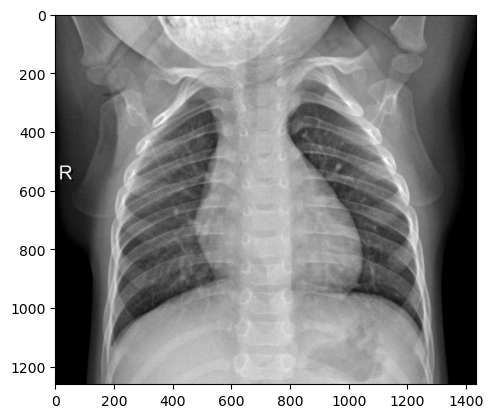

C:\Users\Callum\Desktop\xray_dataset2/729.jpg


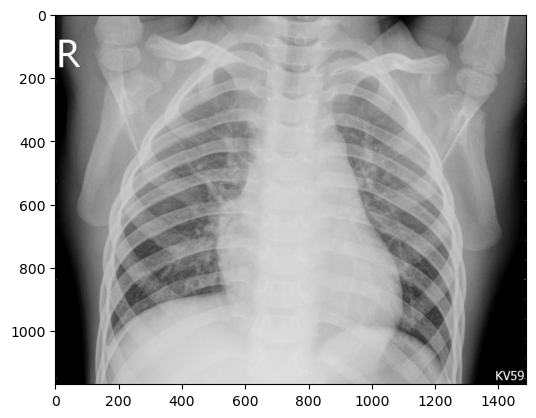

C:\Users\Callum\Desktop\xray_dataset2/269.jpg


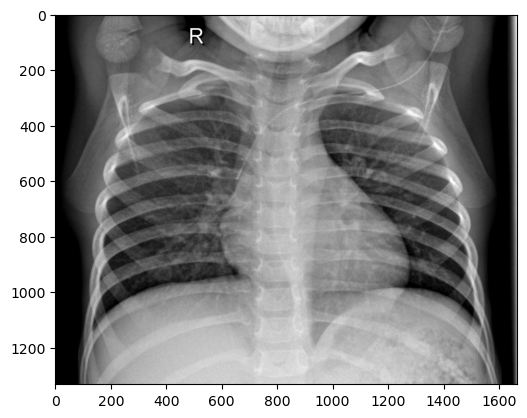

C:\Users\Callum\Desktop\xray_dataset2/808.jpg


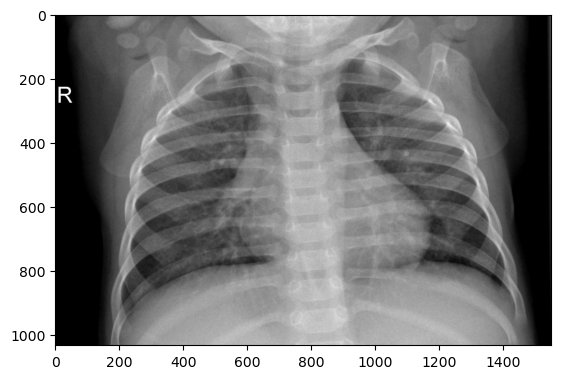

C:\Users\Callum\Desktop\xray_dataset2/715.jpg


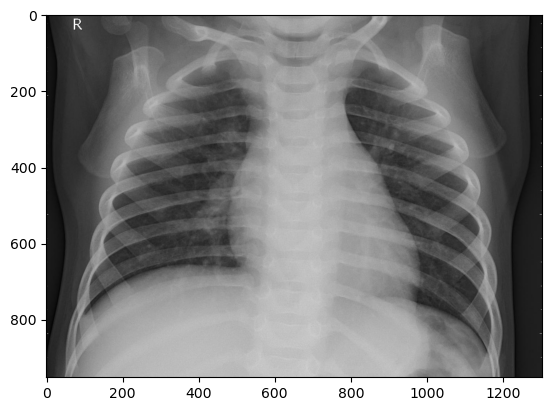

C:\Users\Callum\Desktop\xray_dataset2/242.jpg


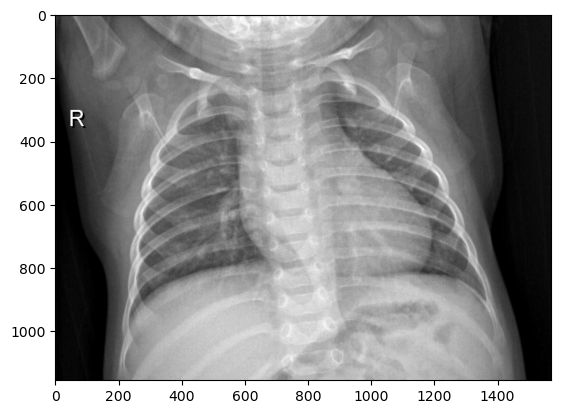

C:\Users\Callum\Desktop\xray_dataset2/643.jpg


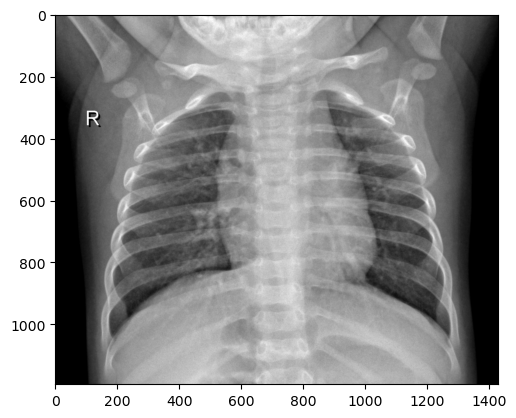

C:\Users\Callum\Desktop\xray_dataset2/364.jpg


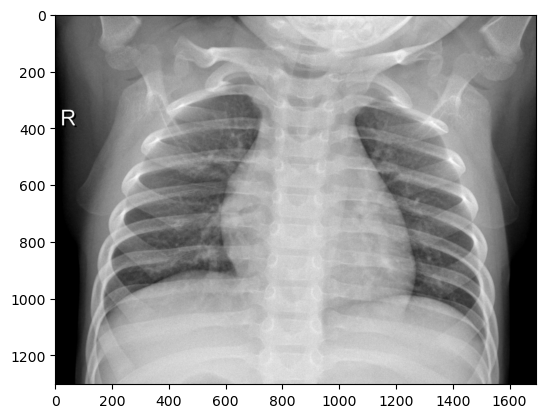

C:\Users\Callum\Desktop\xray_dataset2/582.jpg


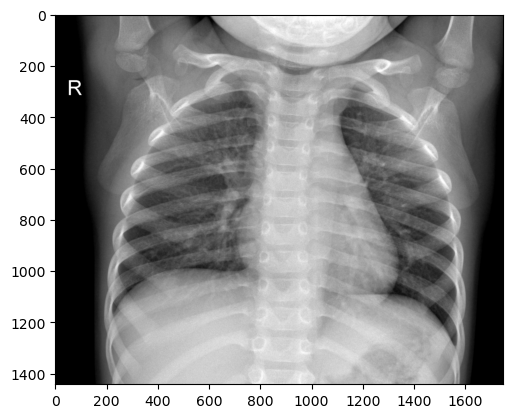

C:\Users\Callum\Desktop\xray_dataset2/382.jpg


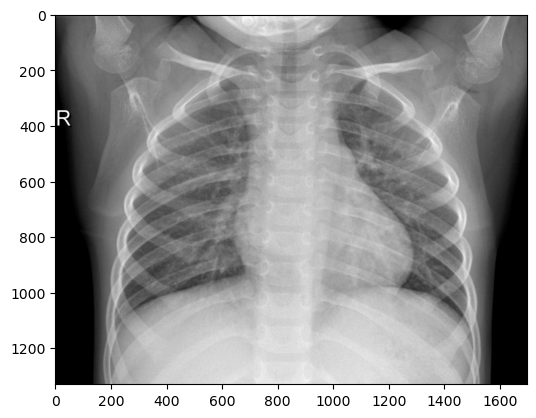

In [94]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
encoder = ConvEncoder()

encoder.load_state_dict(torch.load(ENCODER_MODEL_PATH, map_location=device))
encoder.eval()
encoder.to(device)

embedding = np.load(EMBEDDING_PATH)

indices_list = compute_similar_images(TEST_IMAGE_PATH, NUM_IMAGES, embedding, device)
plot_similar_images(indices_list)

In [95]:
indices_list = compute_similar_images((TEST_IMAGE_PATH), NUM_IMAGES, embedding, device)

Image tensor shape: torch.Size([1, 3, 512, 512])
Image embedding shape: (1, 256, 16, 16)
Flattened embedding shape: (1, 65536)
KNN indices: [[114, 730, 270, 809, 716, 243, 644, 365, 583, 383]]


## Pre-trained

### Img2Vec

In [ ]:
%pip install img2vec-pytorch

In [97]:
from img2vec_pytorch import Img2Vec
from PIL import Image
import os
import pickle

In [98]:
input_path = r'C:\Users\Callum\Desktop\Newfolder\image_similarity_keras_knn-1\images_directory\images/'

In [99]:
img2vec = Img2Vec(cuda=False, model='efficientnet_b7')

In [100]:
print('Getting vectors for images...\n')

images = {}
for file in os.listdir(input_path):
    filename = os.fsdecode(file)
    img = Image.open(os.path.join(input_path + filename)).convert('RGB')
    vec = img2vec.get_vec(img)
    images[file] = vec

Getting vectors for images...



In [ ]:
images.values()

In [102]:
index_zero = list(images.items())[0]
index_zero

('000001-1.jpg',
 array([-0.24627648, -0.19507015,  0.48320603, ..., -0.17871152,
        -0.19124416, -0.24185298], dtype=float32))

In [103]:
#function to save the dictionary as a pickle file
def save_obj(obj, name):
    with open(name + '.pkl', 'wb') as f:
        pickle.dump(obj, f, pickle.HIGHEST_PROTOCOL)

In [104]:
#function to load the dictionary from a pickle file
def load_obj(name):
    with open(name + '.pkl', 'rb') as f:
        return pickle.load(f)

In [105]:
save_obj(images, 'efficientnet_b0_vectors')

### Faiss


In [ ]:
%pip install faiss-cpu

In [107]:
import faiss

In [108]:
embeddings = np.array(list(images.values()))

In [109]:
embeddings.shape

(930, 2560)

In [110]:
embeddings.shape[1]

2560

In [111]:
d = embeddings.shape[1]                           # dimension
nb = 930                      # database size

In [112]:
index = faiss.IndexFlatL2(d)   # build the index

In [113]:
index.is_trained

True

In [114]:
index.add(embeddings)          # add vectors to the index

In [115]:
index.ntotal

930

In [116]:
query_img = Image.open(r'C:\Users\Callum\Desktop\Newfolder\image_similarity_keras_knn-1\images_directory\images\0a6c60063b4bae4de001caaba306d1_jumbo.jpeg').convert('RGB')

In [117]:
xq = img2vec.get_vec(query_img)

In [118]:
print(np.array(xq))

[-0.21902761 -0.13151434  0.7904767  ... -0.26857    -0.26931733
 -0.2361626 ]


In [119]:
k = 8

In [120]:
%%time
D, I = index.search(np.array([xq]), k) # sanity check
print(I)

[[113 451 628 187 218 428 807 538]]
CPU times: total: 125 ms
Wall time: 1.89 ms


In [121]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

Filename: 0a6c60063b4bae4de001caaba306d1_jumbo.jpeg


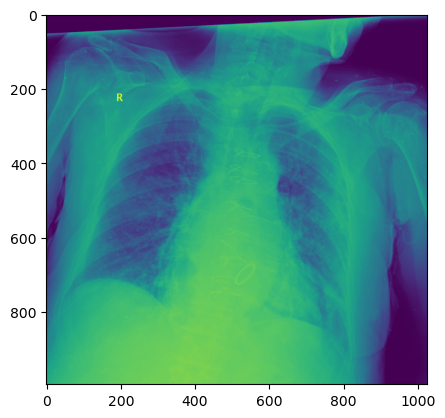

Filename: 5e6dd879fde9502400e58b2f.jpeg


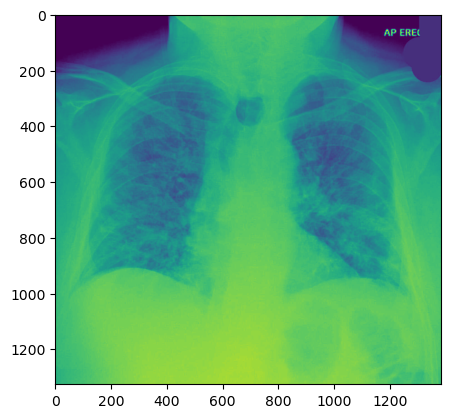

Filename: c94ef38ddb2d94aa11828716777139_jumbo.jpeg


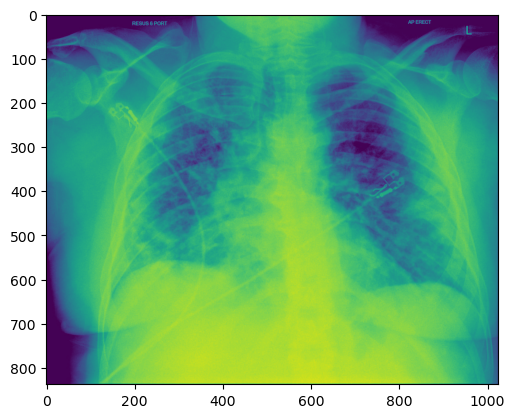

Filename: 10.1016-slash-j.anl.2020.04.002-c.png


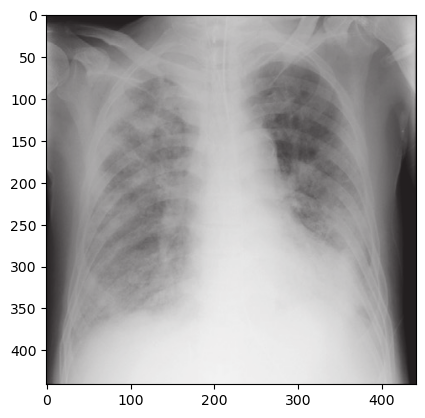

Filename: 13cd850b02d1afe48c113a73eed882_jumbo-1.jpg


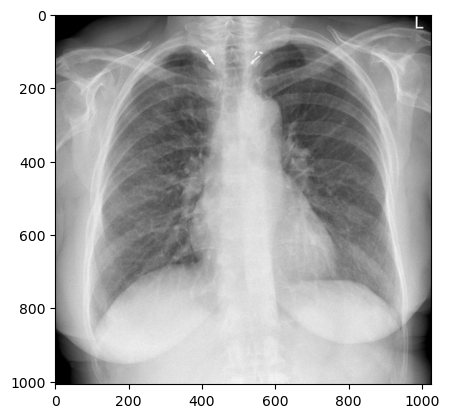

Filename: 4fcafe41.jpg


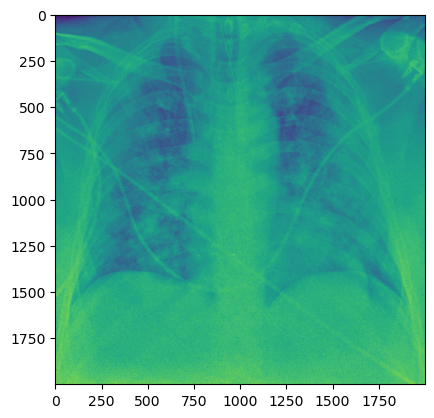

Filename: figure1-5e75d0940b71e1b702629659-98-right.jpeg


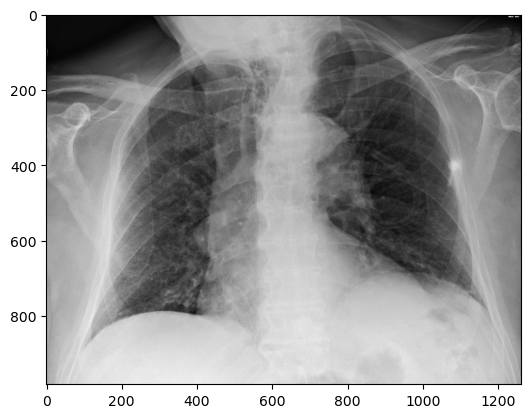

Filename: 9fdd3c3032296fd04d2cad5d9070d4_jumbo.jpeg


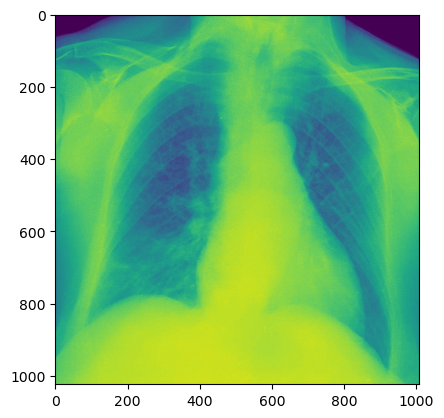

In [122]:
#list comprehension to get the filenames of the top k images and display them
top_k = [list(images.keys())[i] for i in I[0]]
for i in top_k:
    print('Filename:', i)
    img=mpimg.imread(input_path + i)
    imgplot = plt.imshow(img)
    plt.show()

In [ ]:
[f'{input_path}{list(images.keys())[i]}' for i in I[0]]

#### Voronoli Cells

In [124]:
nlist = 50
quantizer = faiss.IndexFlatL2(d)  # the other index
index = faiss.IndexIVFFlat(quantizer, d, nlist, faiss.METRIC_L2)

In [125]:
index.is_trained

False

In [126]:
index.train(embeddings)

In [127]:
index.is_trained

True

In [128]:
index.ntotal

0

In [129]:
index.add(embeddings)

In [130]:
index.ntotal

930

In [131]:
%%time
D, I = index.search(np.array([xq]), k) # sanity check
print(I)

[[113 628 218 722 905 504 186   0]]
CPU times: total: 0 ns
Wall time: 0 ns


Filename: 0a6c60063b4bae4de001caaba306d1_jumbo.jpeg


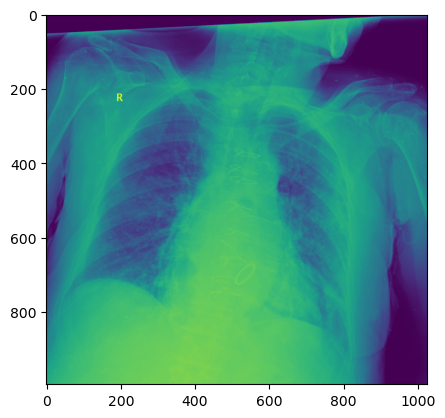

Filename: c94ef38ddb2d94aa11828716777139_jumbo.jpeg


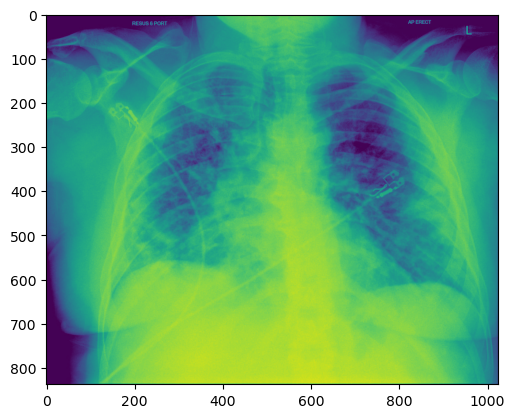

Filename: 13cd850b02d1afe48c113a73eed882_jumbo-1.jpg


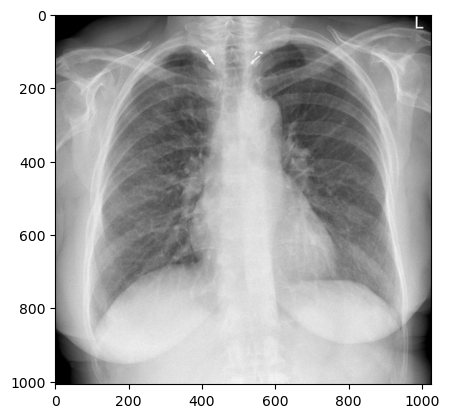

Filename: covid-19-pneumonia-evolution-over-a-week-1-day4.jpg


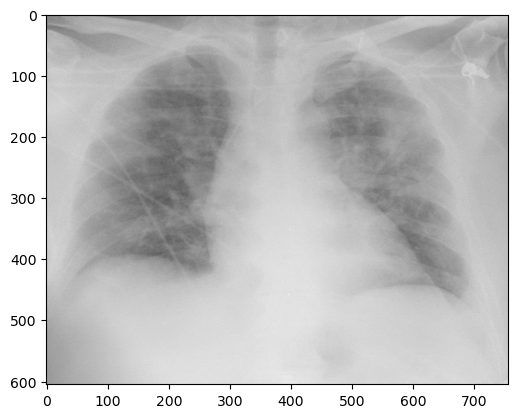

Filename: SARS-10.1148rg.242035193-g04mr34g05x-Fig5-day9.jpeg


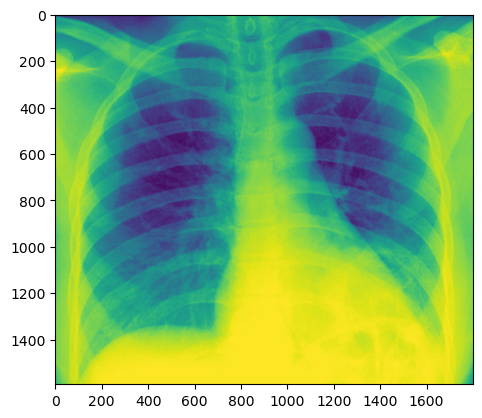

Filename: 84da526d0453b9b9e7896631e6b366_jumbo.jpeg


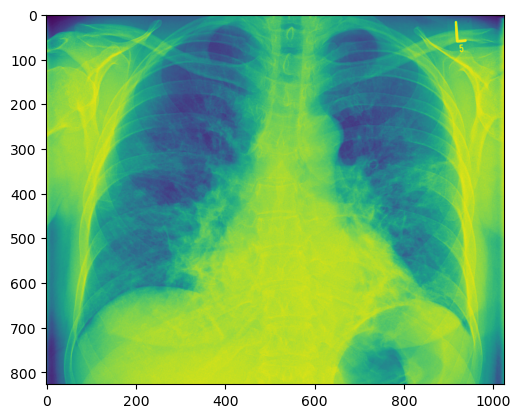

Filename: 10.1016-slash-j.anl.2020.04.002-b.png


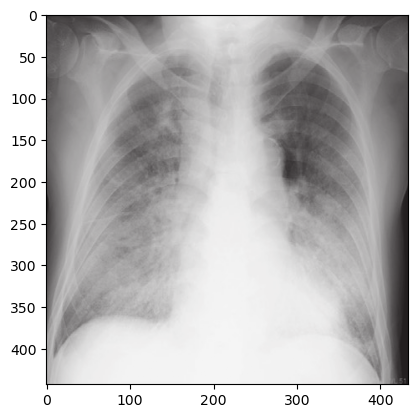

Filename: 000001-1.jpg


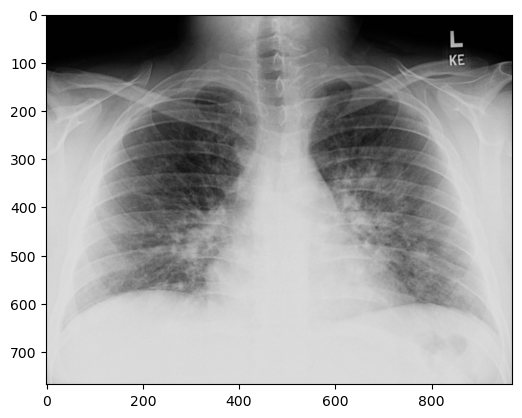

In [132]:
#list comprehension to get the filenames of the top k images and display them
top_k = [list(images.keys())[i] for i in I[0]]
for i in top_k:
    print('Filename:', i)
    img=mpimg.imread(input_path + i)
    imgplot = plt.imshow(img)
    plt.show()

In [133]:
index.nprobe = 10

In [134]:
%%time
D, I = index.search(np.array([xq]), k) # sanity check
print(I)

[[113 451 628 187 218 428 807 538]]
CPU times: total: 0 ns
Wall time: 998 µs


Filename: 0a6c60063b4bae4de001caaba306d1_jumbo.jpeg


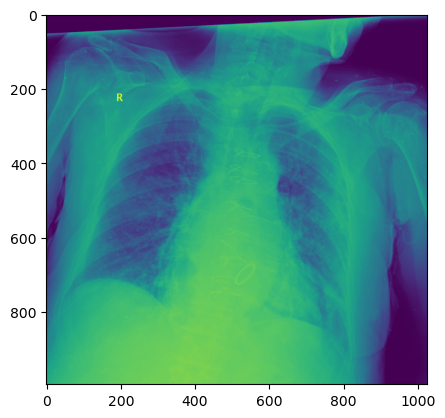

Filename: 5e6dd879fde9502400e58b2f.jpeg


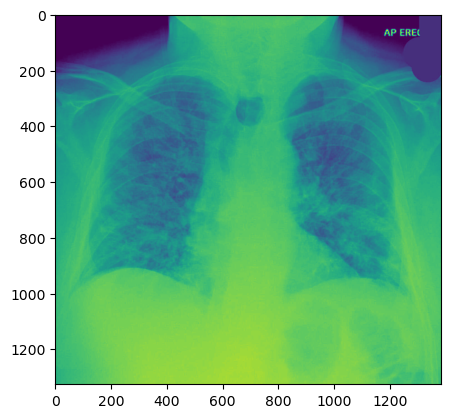

Filename: c94ef38ddb2d94aa11828716777139_jumbo.jpeg


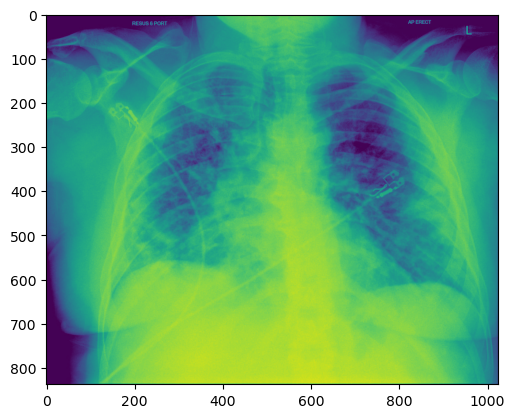

Filename: 10.1016-slash-j.anl.2020.04.002-c.png


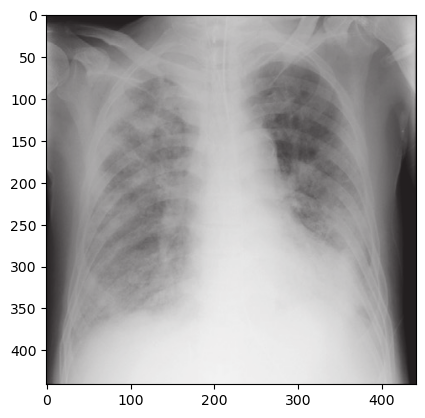

Filename: 13cd850b02d1afe48c113a73eed882_jumbo-1.jpg


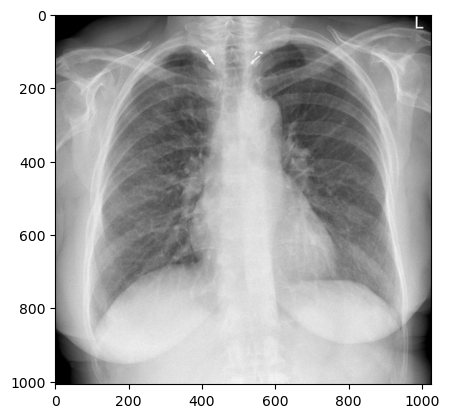

Filename: 4fcafe41.jpg


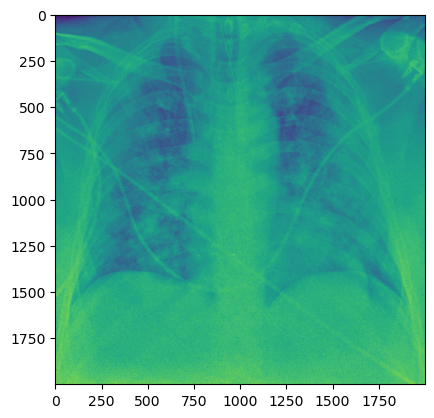

Filename: figure1-5e75d0940b71e1b702629659-98-right.jpeg


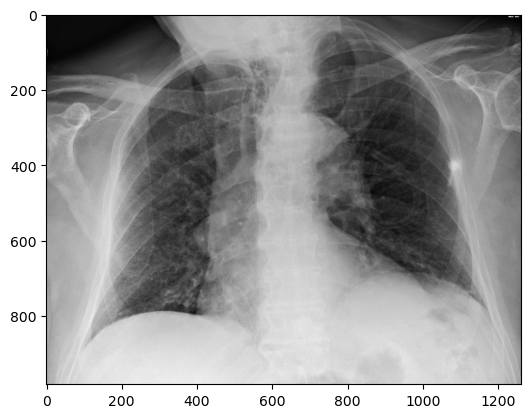

Filename: 9fdd3c3032296fd04d2cad5d9070d4_jumbo.jpeg


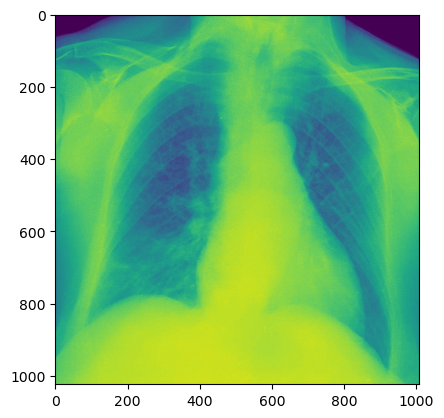

In [135]:
#list comprehension to get the filenames of the top k images and display them
top_k = [list(images.keys())[i] for i in I[0]]
for i in top_k:
    print('Filename:', i)
    img=mpimg.imread(input_path + i)
    imgplot = plt.imshow(img)
    plt.show()

In [136]:
d % 8

0

In [137]:
m = 8
bits = 8

quantizer = faiss.IndexFlatL2(d)  # this remains the same
index = faiss.IndexIVFPQ(quantizer, d, nlist, m, bits)


In [138]:
index.is_trained

False

In [139]:
index.train(embeddings)

In [140]:
index.is_trained

True

In [141]:
index.add(embeddings)

In [142]:
%%time
D, I = index.search(np.array([xq]), k) # sanity check
print(I)

[[113 872 628 905 218 722 840 238]]
CPU times: total: 141 ms
Wall time: 1 ms


Filename: 0a6c60063b4bae4de001caaba306d1_jumbo.jpeg


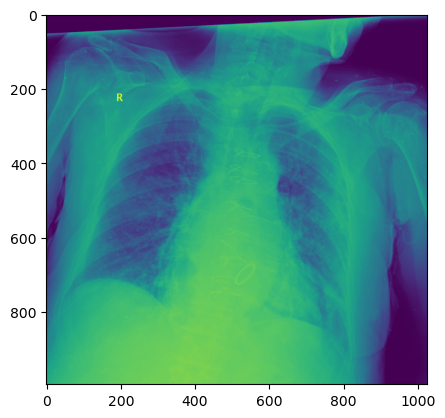

Filename: pneumocystis-pneumonia-8.jpg


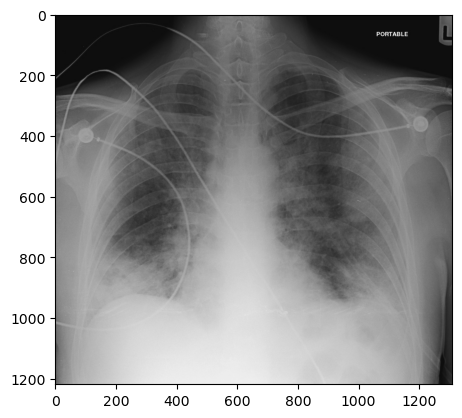

Filename: c94ef38ddb2d94aa11828716777139_jumbo.jpeg


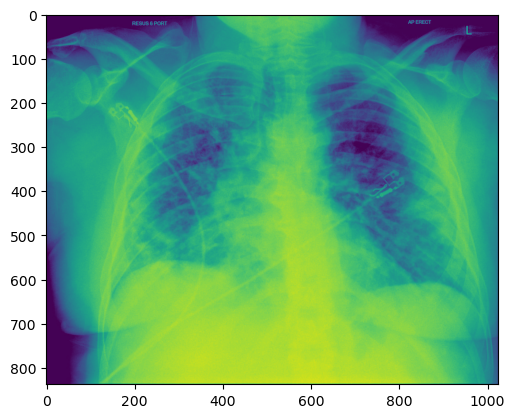

Filename: SARS-10.1148rg.242035193-g04mr34g05x-Fig5-day9.jpeg


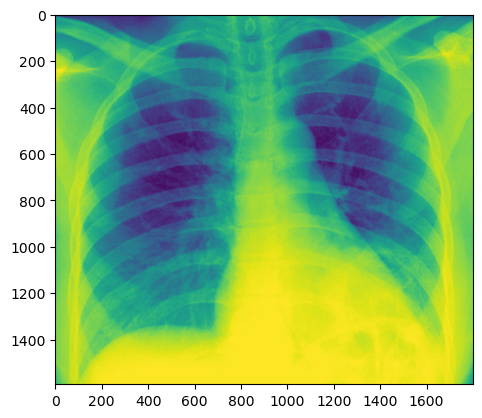

Filename: 13cd850b02d1afe48c113a73eed882_jumbo-1.jpg


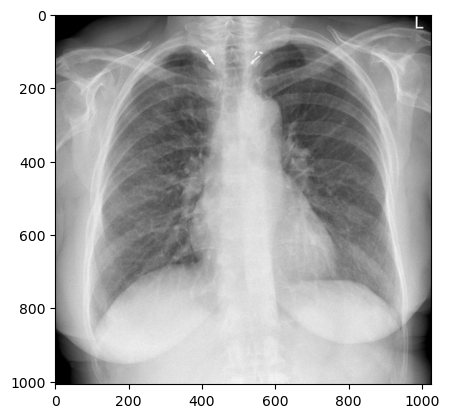

Filename: covid-19-pneumonia-evolution-over-a-week-1-day4.jpg


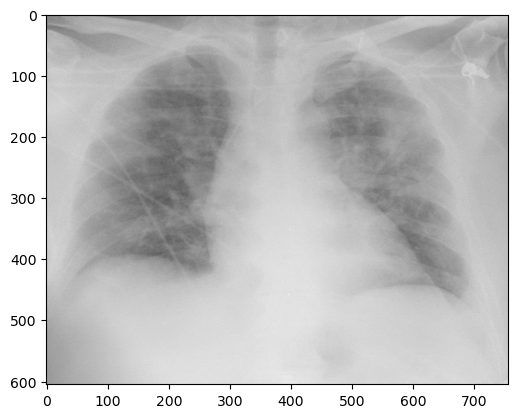

Filename: nejmc2001573_f1a.jpeg


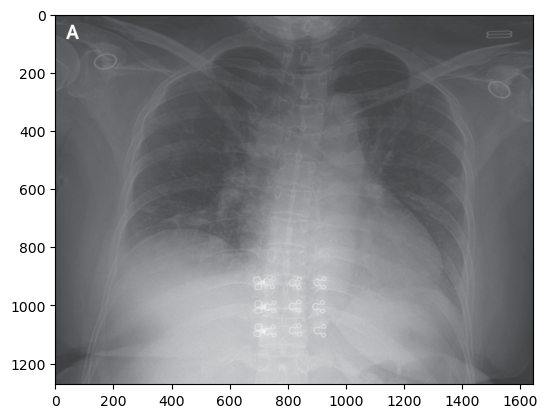

Filename: 16646_1_1.jpg


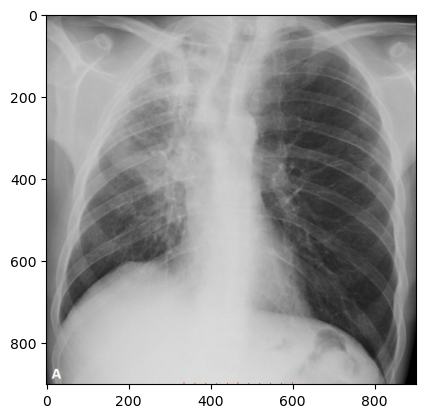

In [143]:
#list comprehension to get the filenames of the top k images and display them
top_k = [list(images.keys())[i] for i in I[0]]
for i in top_k:
    print('Filename:', i)
    img=mpimg.imread(input_path + i)
    imgplot = plt.imshow(img)
    plt.show()

### Sentence Transformers - Dense Vector Representations

In [ ]:
%pip install scikit-image sentence-transformers

In [147]:
from sentence_transformers import SentenceTransformer, util
from PIL import Image
import glob
import os
from skimage import io

# Load the OpenAI CLIP Model
print('Loading CLIP Model...')
model = SentenceTransformer('clip-ViT-B-32')

# Next we compute the embeddings
# To encode an image, you can use the following code:
# from PIL import Image
# encoded_image = model.encode(Image.open(filepath))
image_names = list(glob.glob((r'C:\Users\Callum\Desktop\Newfolder\image_similarity_keras_knn-1\images_directory\images/*.jpg')))
print("Images:", len(image_names))
encoded_image = model.encode([Image.open(filepath) for filepath in image_names], batch_size=128, convert_to_tensor=True, show_progress_bar=True)

# Now we run the clustering algorithm. This function compares images aganist 
# all other images and returns a list with the pairs that have the highest 
# cosine similarity score
processed_images = util.paraphrase_mining_embeddings(encoded_image)
NUM_SIMILAR_IMAGES = 10 

# =================
# DUPLICATES
# =================
print('Finding duplicate images...')
# Filter list for duplicates. Results are triplets (score, image_id1, image_id2) and is scorted in decreasing order
# A duplicate image will have a score of 1.00
# It may be 0.9999 due to lossy image compression (.jpg)
duplicates = [image for image in processed_images if image[0] >= 0.999]

# Output the top X duplicate images
for score, image_id1, image_id2 in duplicates[0:NUM_SIMILAR_IMAGES]:
    print("\nScore: {:.3f}%".format(score * 100))
    print(image_names[image_id1])
    print(image_names[image_id2])

# =================
# NEAR DUPLICATES
# =================
print('Finding near duplicate images...')
# Use a threshold parameter to identify two images as similar. By setting the threshold lower, 
# you will get larger clusters which have less similar images in it. Threshold 0 - 1.00
# A threshold of 1.00 means the two images are exactly the same. Since we are finding near 
# duplicate images, we can set it at 0.99 or any number 0 < X < 1.00.
threshold = 0.99
near_duplicates = [image for image in processed_images if image[0] < threshold]

for score, image_id1, image_id2 in near_duplicates[0:NUM_SIMILAR_IMAGES]:
    print("\nScore: {:.3f}%".format(score * 100))
    print(image_names[image_id1])
    print(image_names[image_id2])

Loading CLIP Model...
Images: 512


Batches:   0%|          | 0/4 [00:00<?, ?it/s]

Finding duplicate images...

Score: 100.000%
C:\Users\Callum\Desktop\Newfolder\image_similarity_keras_knn-1\images_directory\images\1-s2.0-S0378603X1500248X-gr4e.jpg
C:\Users\Callum\Desktop\Newfolder\image_similarity_keras_knn-1\images_directory\images\MERS-CoV-1-s2.0-S0378603X1500248X-gr4e.jpg

Score: 99.942%
C:\Users\Callum\Desktop\Newfolder\image_similarity_keras_knn-1\images_directory\images\4c8dee3d9fe81567b98ed1b0b2b4c6_jumbo.JPG
C:\Users\Callum\Desktop\Newfolder\image_similarity_keras_knn-1\images_directory\images\klebsiella-pneumonia-1.jpg

Score: 99.931%
C:\Users\Callum\Desktop\Newfolder\image_similarity_keras_knn-1\images_directory\images\16660_4_1.jpg
C:\Users\Callum\Desktop\Newfolder\image_similarity_keras_knn-1\images_directory\images\covid-19-rapidly-progressive-acute-respiratory-distress-syndrome-ards-day-2.jpg

Score: 99.915%
C:\Users\Callum\Desktop\Newfolder\image_similarity_keras_knn-1\images_directory\images\16660_3_1.jpg
C:\Users\Callum\Desktop\Newfolder\image_simil